# Introduction

Businesses have been moving from traditional on-premise and offline tools to Software as a Service (SaaS) solutions. These cloud-based tools are crucial for tasks like accounting, office productivity, and customer relationship management (CRM). A key aspect of this trend is Business-to-Business (B2B) SaaS, where companies sell software to other businesses on a subscription basis.

This report presents an exploratory data analysis (EDA) of a fictitious B2B SaaS company. While the dataset does not match real-world data, it has a structure comparable to any well-organized financial data. This analysis aims to uncover valuable patterns, trends, and insights to help the company better understand its sales dynamics, customer behavior, and profitability.

# Business Question

This analysis aims to address the following key business questions:

1. **Revenue**: What is the condition of the current annual revenue stream? How does it compare to previous periods? Is there significant growth or decline? What are the primary drivers of revenue? Are there areas where revenue is increasing or decreasing significantly? How is it trending over time?
2. **Profitability**: How does cost compare to revenue? What is the overall profitability of the company? How does the net profit compare to previous periods?  Are there any trends or patterns in net profit that need addressing? What are the profit margins of products? Are the margins growing or declining?
3. **Discounting**: How do discounts effect sales and profit margin? Is there a clear strategy for when and why discounts are offered? Are the discounts sustainable without significantly impacting net profit?
4. **Product Performance**: Are there any products that are particularly successful or underperforming in terms of financial health? What are the financial challenges of each product?

This analysis also aims to uncover other valuable insights unique to the SaaS industry, such as customer retention, which should be examined individually per product through separate reports. Ultimately, this analysis intends to provide actionable insights to guide decision-making and enhance overall business performance. 

# Report Structure

This report is organized as follows:

- **Data Overview** - dataset overview, dataset source, size, and initial observations
- **Data Preprocessing** - data cleaning, handling missing values, and preparation for analysis
- **Exploratory Data Analysis** - analysis: statistical summaries, visualizations, and key findings
- **Conclusion** - summary of the main insights from the analysis
- **Recommendations** - recommendations based on the findings
- **Reference** - references used in the report

> # Key Findings
>Summarized below are the key findings from this analysis. Throughout the 4-year period from 2020 to 2023:
>
>Revenue
>* Higher revenue is observed in March, September, November, and December, with significant peaks in November (annual average  $74,081) and December (annual average  $72,616). These peaks are due to factors like end-of-year subscription renewals and annual promotions. February generally sees lower revenue (annual average  $13,538), likely due to post-holiday spending reductions.
>* Despite overall growth, the company experienced revenue declines in February 2023 ($16,855) compared to February 2022 ($21,603), and in December 2023 ($78,650) compared to December 2022 ($87,898), indicating periodic challenges that may affect short-term performance.
>* Highest YoY growth occurred in 2022 at 29.4%, with strong but slightly lower growth in 2023 at 19.87%. This suggests successful initiatives in 2022 and continued, albeit slower, growth in 2023.
>* With annual revenue between $406,690 (2020) and $632,548 (2023), the company is in the early-stage bracket (Seed to early Series A). The primary goal at this stage is to maximize top-line growth, demonstrate product-market fit, and capture market share, while preparing for efficient, profitable operations as the company matures.
>
>Profitability
>* Highest monthly profit peak was in 2022, driven by significant sales in October ($15,763) and December ($17,903). October 2022 was unique for having a peak, suggesting specific events, promotions, or market conditions contributed to unusually high revenue and profit. Understanding these factors can help replicate similar successes in future years.
>* Although profit peaks in 2023 were lower than in 2022, overall profit was more stable. Strong performance was seen in March ($12,958), September ($11,395), and August ($8,894). This stability suggests improved cost control and operational efficiency, beneficial for long-term financial health and reducing volatility compared to previous years.
>* While both revenue and net profit improved each year, the growth rates varied. In 2021, revenue grew by 0.24% and net profit by 24.37%. In 2022, revenue increased by 29.44% and net profit by 32.63%. However, in 2023, revenue growth (19.87%) outpaced net profit growth (14.41%), suggesting rising costs or operational inefficiencies may be affecting profit conversion.
>* Balancing revenue growth and net profit is a key area for improvement based on metric "the Rule of 40". While 2022 showed strong performance with a combined score of 44.93%, surpassing the Rule of 40, 2021 and 2023 fell below the 40% threshold. This highlights the need for better cost management and operational efficiency to consistently balance growth and profitability. 
>
>Discounting
>* There is a strong positive correlation between "Discounts YoY" and "Sales YoY," indicating that increased discounts typically boost sales volumes. However, the relationship between Net Profit YoY Growth and Discounts YoY suggests diminishing returns on profitability from aggressive discounting. In 2021, reduced discounts effectively managed costs, with a notable gap between Net Profit YoY growth (24%), Discounts YoY (-18.95%), and Sales YoY (-2.8%). In 2022, increased discounts fueled both sales and profit growth, with closely aligned values for Net Profit YoY (32.6%), Discounts YoY (28.5%), and Sales YoY (29%). Conversely, in 2023, Net Profit YoY growth slowed to 14.4%, while Discounts YoY (25.5%) and Sales YoY (20.6%) rose, suggesting diminishing returns.
>* Products have consistently maintained the same range of discounts over the years. Higher profit margin products, like SaaS Connector Pack - Gold and Support, use stable discounting strategies (e.g., 20%) and sustain profitability without varying discounts heavily. In contrast, lower margin products, such as ContactMatcher and OneView, often use aggressive discounts (up to 80%) to attract customers, leading to instability and reduced profitability.
>* In 2023, some products, including Support, Data Smasher, ChatBot Plugin, Storage, SaaS Connector Pack - Gold, and Alchemy, maintained good profitability as their Average Overall Sales Cost never exceeded their Average Sales. However, eight products—FinanceHub, Site Analytics, Marketing Suite - Gold, ContactMatcher, SaaS Connector Pack, OneView, Marketing Suite, and Big Ol Database—had Average Overall Sales Costs exceeding their Average Sales, limiting discount options.
>
>Product Performance
>* [Product Performance Summary (2020-2023)](#product-performance-summary-2020-2023)
>* [Per Product Performance (2023)](#per-product-performance-2023)

Importing relevant libraries:

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from scipy import interpolate
from matplotlib.patches import Patch
from matplotlib.lines import Line2D  

plt.style.use('ggplot')
pd.set_option('display.max_columns',30)
pd.set_option('display.max_colwidth',None)
pd.set_option('display.float_format', lambda x: '%.4f' % x)

# 1. Data Overview

The dataset that will be used in this analysis is the "Amazon SaaS Sales Data Analysis" data available on Kaggle (https://www.kaggle.com/datasets/nnthanh101/aws-saas-sales/code). It is available in csv format. It has been loaded to a data frame called 'df'. 

In [2]:
df = pd.read_csv('SaaS-Sales.csv')
df.head(3)

,Row ID,Order ID,Order Date,Date Key,Contact Name,Country,City,Region,Subregion,Customer,Customer ID,Industry,Segment,Product,License,Sales,Quantity,Discount,Profit
0,1,EMEA-2022-152156,11/9/2022,20221109,Nathan Bell,Ireland,Dublin,EMEA,UKIR,Chevron,1017,Energy,SMB,Marketing Suite,16GRM07R1K,261.9600,2,0.0000,41.9136
1,2,EMEA-2022-152156,11/9/2022,20221109,Nathan Bell,Ireland,Dublin,EMEA,UKIR,Chevron,1017,Energy,SMB,FinanceHub,QLIW57KZUV,731.9400,3,0.0000,219.5820
2,3,AMER-2022-138688,6/13/2022,20220613,Deirdre Bailey,United States,New York City,AMER,NAMER,Phillips 66,1056,Energy,Strategic,FinanceHub,JI6BVL70HQ,14.6200,2,0.0000,6.8714


This dataset contains records of successfully sold orders. It includes various important information such as `Order Date`, `Country` and `Region` of origin, as well as other crucial details related to product sales like `Product`, `Sales`, `Quantity`, and `Profit`.

Here's a brief overview of each piece of information in the dataset columns:

- `Row ID`: unique ID per data row
- `Order ID`: unique ID for each order
- `Order Date`: the date the order was placed
- `Date Key`: order date key (in yyyymmdd format)
- `Contact Name`: name of the individual representative from the ordering company
- `Country`: the country where the ordering company conducts business
- `City`: the city where the ordering company conducts business
- `Region`: the continent (business region) of the company's business activities
- `Subregion`: the subregion of the area where the company's business activities occur
- `Customer`: name of the ordering company
- `Customer ID`: unique ID for the ordering company
- `Industry`: economic domain/activity of the ordering company
- `Segment`: type/category of the ordering company
- `Product`: name/type of the product
- `License`: unique usage license for one product type per order
- `Sales`: total sales value of one product type per order
- `Quantity`: number of units sold for one product type per order
- `Discount`: percentage discount for one product type per order
- `Profit`: total profit from sales of one product type per order (net profit; includes cost calculation and discount application)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Row ID        9994 non-null   int64  
 1   Order ID      9994 non-null   object 
 2   Order Date    9994 non-null   object 
 3   Date Key      9994 non-null   int64  
 4   Contact Name  9994 non-null   object 
 5   Country       9994 non-null   object 
 6   City          9994 non-null   object 
 7   Region        9994 non-null   object 
 8   Subregion     9994 non-null   object 
 9   Customer      9994 non-null   object 
 10  Customer ID   9994 non-null   int64  
 11  Industry      9994 non-null   object 
 12  Segment       9994 non-null   object 
 13  Product       9994 non-null   object 
 14  License       9994 non-null   object 
 15  Sales         9994 non-null   float64
 16  Quantity      9994 non-null   int64  
 17  Discount      9994 non-null   float64
 18  Profit        9994 non-null 

# 2. Data Preprocessing

With the overview, the dataset will not need a lot of data cleaning. However, there are certain transformations that needs to be done to ready the data for the analysis. Specifically, the `Row ID` column and some others are not necessary for this particular analysis and will be removed. Feature engineering will also be done.

In [3]:
df=df.drop('Row ID',axis=1)

df=df[[ 
        'Order ID',                        
        'Order Date',              
        'Date Key',                
    #'Contact Name',            
        'Customer ID',                
        'Customer',               
        'Segment',                 
        'Industry',                
        'Region',                 
        'Subregion', 
        'Country', 
        'City', 
    #'License',   
        'Product',
        'Sales', 
        'Quantity', 
        'Discount', 
        'Profit']]


In [4]:
# Feature engineering and creation of new columns for business analysis

# Discount amount in dollars
df['total_discount_in_dollars'] = df['Sales'] * df['Discount']
# This calculates the total discount given in dollars by multiplying the sales amount by the discount rate.

# Sales value of one unit of the product
df['selling_price'] = df['Sales'] / df['Quantity']
# This calculates the selling price per unit by dividing the total sales amount by the quantity sold.

# Net profit before the application of the discount
df['(net)_profit_before_discount'] = df['Sales'] * df['Discount'] + df['Profit']
# This calculates the net profit before applying the discount by adding the discount amount to the profit.

# Net profit for the sale of one unit of the product
df['net_profit_per_unit_sold'] = df['Profit'] / df['Quantity']
# This calculates the net profit per unit sold by dividing the total profit by the quantity sold.

# Change column name from 'Profit' to 'net_profit'
df = df.rename(columns={'Profit': 'net_profit'})
# This renames the 'Profit' column to 'net_profit' for clarity.

# View profit margin
df['profit_margin'] = df['net_profit'] / df['Sales'] * 100
# This calculates the profit margin as a percentage by dividing the net profit by the total sales and multiplying by 100.

# Consideration of sales value from the application of the discount
df['discounted_sales'] = df['Sales'] - (df['Discount'] * df['Sales'])
# This calculates the sales amount after applying the discount by subtracting the discount amount from the total sales.

# Overall cost per Order
df['overall_cost'] = df['discounted_sales'] - df['net_profit']
# This calculates the overall cost by subtracting the net profit from the discounted sales amount.

#---------------------Dates---------------------#

# Feature engineering, converting from object type to datetime type for year and month extraction
df['Order Date'] = pd.DatetimeIndex(df['Order Date'])
# This converts the 'Order Date' column from object type to datetime type.

df['year'] = df['Order Date'].dt.year
# This extracts the year from the 'Order Date' column.

df['year_month'] = df['Order Date'].dt.to_period('M')
# This extracts the year and month from the 'Order Date' column and converts it to a period format.

df['month'] = df['Order Date'].dt.month
# This extracts the month from the 'Order Date' column.

df.head(3)  # final dataframe, after columns were removed and features were added


,Order ID,Order Date,Date Key,Customer ID,Customer,Segment,Industry,Region,Subregion,Country,City,Product,Sales,Quantity,Discount,net_profit,total_discount_in_dollars,selling_price,(net)_profit_before_discount,net_profit_per_unit_sold,profit_margin,discounted_sales,overall_cost,year,year_month,month
0,EMEA-2022-152156,2022-11-09,20221109,1017,Chevron,SMB,Energy,EMEA,UKIR,Ireland,Dublin,Marketing Suite,261.9600,2,0.0000,41.9136,0.0000,130.9800,41.9136,20.9568,16.0000,261.9600,220.0464,2022,2022-11,11
1,EMEA-2022-152156,2022-11-09,20221109,1017,Chevron,SMB,Energy,EMEA,UKIR,Ireland,Dublin,FinanceHub,731.9400,3,0.0000,219.5820,0.0000,243.9800,219.5820,73.1940,30.0000,731.9400,512.3580,2022,2022-11,11
2,AMER-2022-138688,2022-06-13,20220613,1056,Phillips 66,Strategic,Energy,AMER,NAMER,United States,New York City,FinanceHub,14.6200,2,0.0000,6.8714,0.0000,7.3100,6.8714,3.4357,47.0000,14.6200,7.7486,2022,2022-06,6


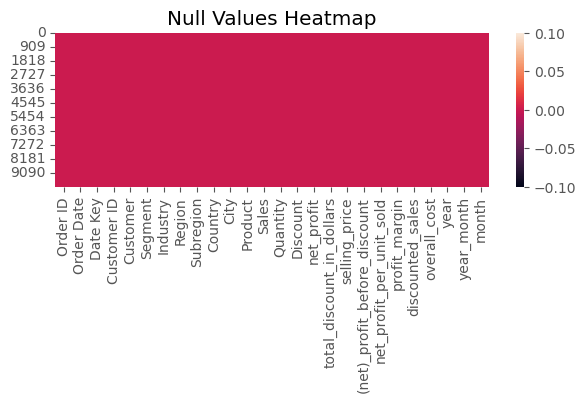

In [5]:
plt.figure(figsize=(7,2))

plt.title('Null Values Heatmap')
sns.heatmap(df.isnull())
plt.show()

The heatmap above shows that there are no missing values in the dataset.

With this information, the data looks ready for analysis. In real-world practice, data cleaning or transformation is always done on every dataset. This includes handling missing values, changing data types, standardizing data values, feature engineering, and other tasks.

This dataset is unusual because it doesn't need much cleaning or transformation, although further analysis might reveal some data that needs to be changed.

Thus, the process can proceed to the next stage.

# 3. Exploratory Data Analysis (EDA)

In [6]:
print('Here are the descriptive statistics of the numerical data. Doing this can reveal any anomalies in the data.')
df.describe()

Here are the descriptive statistics of the numerical data. Doing this can reveal any anomalies in the data.


,Order Date,Date Key,Customer ID,Sales,Quantity,Discount,net_profit,total_discount_in_dollars,selling_price,(net)_profit_before_discount,net_profit_per_unit_sold,profit_margin,discounted_sales,overall_cost,year,month
count,9994,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000,9994.0000
mean,2022-05-01 00:07:12.259355648,20218026.4660,1049.7720,229.8580,3.7896,0.1562,28.6569,32.2776,60.9196,60.9345,7.7994,12.0314,197.5804,168.9235,2021.7229,7.8149
min,2020-01-04 00:00:00,20200104.0000,1001.0000,0.4440,1.0000,0.0000,-6599.9780,0.0000,0.3360,-3449.9885,-1319.9956,-275.0000,0.0888,0.5544,2020.0000,1.0000
25%,2021-05-23 00:00:00,20210523.0000,1024.0000,17.2800,2.0000,0.0000,1.7288,0.0000,5.4700,4.7754,0.7228,7.5000,14.3360,10.5743,2021.0000,5.0000
50%,2022-06-27 00:00:00,20220627.0000,1049.0000,54.4900,3.0000,0.2000,8.6665,1.0368,16.2700,14.6352,2.7670,27.0000,45.9232,35.6932,2022.0000,9.0000
75%,2023-05-15 00:00:00,20230515.0000,1076.0000,209.9400,5.0000,0.2000,29.3640,14.8704,63.9400,50.3280,8.7032,36.2500,180.1765,155.0286,2023.0000,11.0000
max,2023-12-31 00:00:00,20231231.0000,1101.0000,22638.4800,14.0000,0.8000,8399.9760,11319.2400,3773.0800,9508.1616,1679.9952,50.0000,17499.9500,13130.3184,2023.0000,12.0000
std,NaN,11238.9760,29.7194,623.2451,2.2251,0.2065,234.2601,164.0256,142.9274,248.7399,56.0750,46.6754,539.0453,430.8698,1.1240,3.2856


This dataset includes sales data from January 4, 2020, to December 31, 2023. No errors or anomalies are seen in the `Sales`, `Quantity`, and `Discount` columns.

However, in the `net_profit`, `(net)_profit_before_discount`, and `net_profit_per_unit_sold` columns, negative values indicated by minus (-) signs are observed. These values represent losses, which is a common reflection in net profit data. Negative values can present problems when converting to percentages, potentially leading to misleading or confusing results.

### **3.1. Revenue**
What is the condition of the current annual revenue stream? How does it compare to previous periods? Is there significant growth or decline? What are the primary drivers of revenue? Are there areas where revenue is increasing or decreasing significantly? How is it trending over time?

Revenue, also known as the top line, is the money a business earns from its core operations—selling products or services. Profit is what's left after subtracting all expenses from revenue. Unlike total sales, which don't account for discounts, revenue (or net revenue) includes these deductions. In this case, using `discounted_sales` as the measure of revenue gives a clearer picture of earnings. 

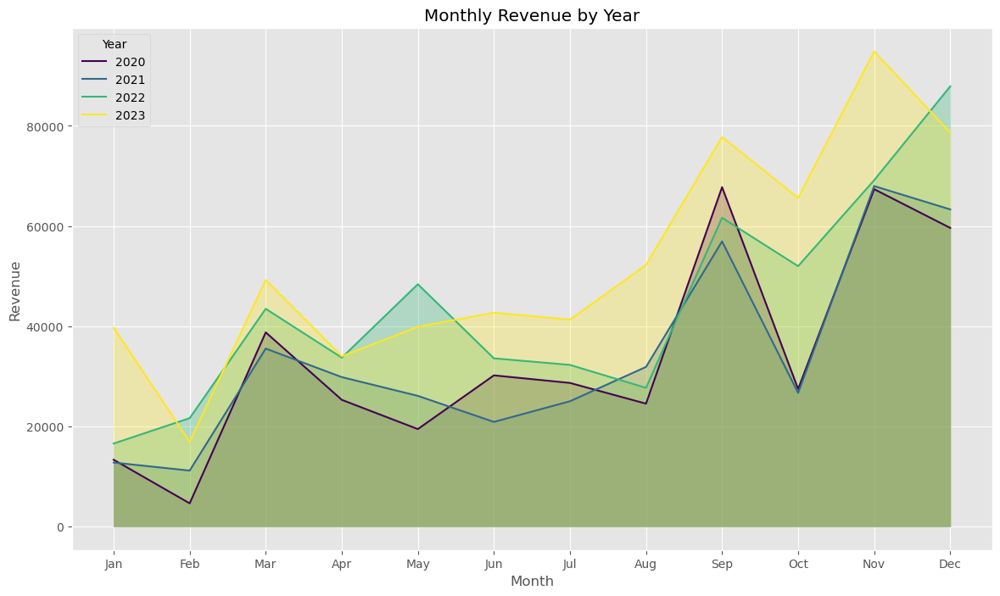

In [7]:
df_grouped = df.groupby(['month', 'year']).agg({'discounted_sales': 'sum'}).reset_index()
df_pivot = df_grouped.pivot(index='month', columns='year', values='discounted_sales').fillna(0)

# Plotting
plt.figure(figsize=(14, 8))
colors = plt.cm.viridis(np.linspace(0, 1, df_pivot.shape[1]))

for i, year in enumerate(df_pivot.columns):
    plt.plot(df_pivot.index, df_pivot[year], label=str(year), color=colors[i])
    plt.fill_between(df_pivot.index, df_pivot[year], color=colors[i], alpha=0.3)

plt.title('Monthly Revenue by Year')
plt.xlabel('Month')
plt.ylabel('Revenue')
plt.legend(title='Year')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()


- Across all years, some seasonal patterns can be identified.  Higher revenue can be spotted in March, September, November, and December. In particular, significant peaks seem to occur in November and December. This could be due to factors such as end-of-year subscription renewals, annual promotions, or budgetary spending by businesses as they close out their financial year. On the other hand, February generally has lower revenue compared to other months. Following high holiday expenditures, businesses may reduce spending in February, contributing to a natural post-holiday slowdown.
- While the SaaS company has shown overall growth, there have been fluctuations. February and December in 2023 saw a decline from the previous year. These dips suggest that despite the general upward trend, the company faces periodic challenges that may affect short-term performance.

#### Annual Revenue & Growth

In [8]:
yearly_revenue_growth=pd.DataFrame(df.groupby(['year'])['discounted_sales'].sum()).reset_index()
yearly_revenue_growth['YoY'] = yearly_revenue_growth['discounted_sales'].pct_change() * 100
yearly_revenue_growth['YoY'] = yearly_revenue_growth['YoY'].fillna(0)
yearly_revenue_growth

,year,discounted_sales,YoY
0,2020,406690.7027,0.0000
1,2021,407671.3237,0.2411
2,2022,527707.8887,29.4444
3,2023,632548.8109,19.8672


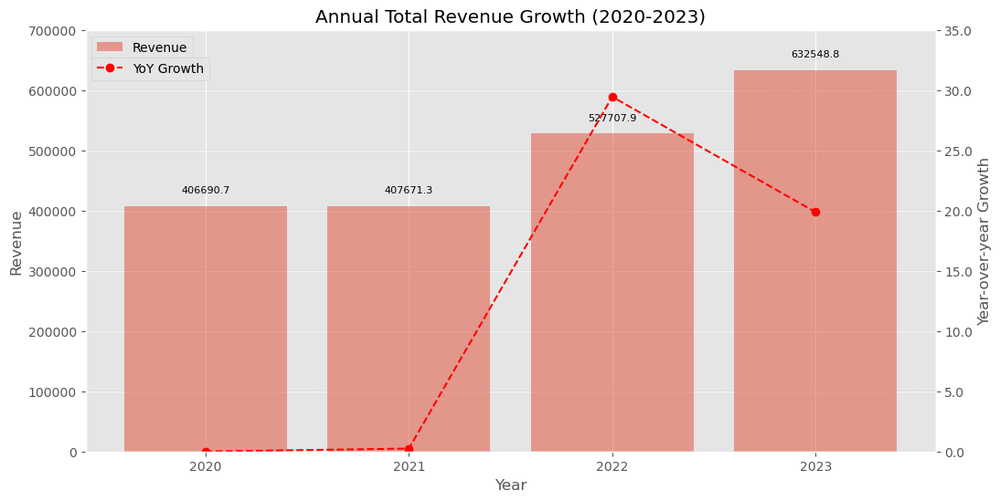

In [9]:
# Yearly Revenue & Growth Chart
fig, ax1 = plt.subplots(figsize=(12, 6))
discounted_sales_bars = ax1.bar(yearly_revenue_growth['year'], yearly_revenue_growth['discounted_sales'], alpha=0.5, label='Revenue')
ax1.set_xlabel('Year')
ax1.set_ylabel('Revenue')
ax1.set_title('Annual Total Revenue Growth (2020-2023)')
ax1.legend(loc='upper left')
ax1.set_xticks([2020, 2021, 2022, 2023])
ax1.set_xticklabels(['2020', '2021', '2022', '2023'])
ax1.set_ylim(0, 700000)
for i, bar in enumerate(discounted_sales_bars):
    value = yearly_revenue_growth['discounted_sales'][i]
    ax1.annotate(format(value, '.1f'), 
                (bar.get_x() + bar.get_width() / 2., value),
                ha='center', va='bottom', 
                xytext=(0, 9),
                fontsize=8, 
                textcoords='offset points')
ax2 = ax1.twinx()
scale_factor = (5 / 100000)
scaled_yoy = yearly_revenue_growth['YoY'] / scale_factor
line_plot = ax2.plot(yearly_revenue_growth['year'], scaled_yoy, 'r--o', label='YoY Growth')
ax2.set_ylabel('Year-over-year Growth')
ax2.set_ylim(0, max(scaled_yoy))
primary_ticks = ax1.get_yticks()
secondary_ticks = [tick * scale_factor for tick in primary_ticks]
ax2.set_yticks(primary_ticks)
ax2.set_yticklabels(secondary_ticks)
ax2.grid(True, which='both', color='grey', linestyle='--', linewidth=0.3, alpha=0.5, zorder=0)
ax2.set_axisbelow(True)
ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
ax2.legend(loc='upper left', bbox_to_anchor=(0, 0.95))

plt.show()


- Highest YoY growth occurred in 2022 at 29.4%, which may indicate the impact of significant events or successful initiatives during that year. 2023 continued with strong growth at 19.87%, slightly lower than 2022.

#### Annual Revenue Assessment

> When evaluating annual revenue for startups, there are some general benchmarks:
>- Series A: $1 million to $2 million ARR
>- Series B: $3 million to $7 million ARR
>- Series C: $7 million to $25 million ARR
>- Series D and beyond: $75 million to $100+ million ARR
>
>In the early stages (Seed through Series B), the priority is rapid growth to capture market share and demonstrate product-market fit. During this phase, success is measured by annual recurring revenue (ARR) growth.
>
> As the company matures (late Series B, Series C, and beyond), the focus shifts to growing efficiently. This involves prioritizing profit margins and net income, especially when preparing for an Initial Public Offering (IPO). A mature and successful company will show strong profitability and a healthy bottom line.

- Our fictitious SaaS company's annual revenue, ranging between $406,690 and $632,548, positions it within the early-stage bracket, likely around Seed to early Series A funding stages. At this stage, the primary goal is to maximize top-line growth, showcasing product-market fit and capturing market share. It has shown an overall upward trend in revenue from 2020 to 2023, with a somewhat steady year-over-year growth rates, especially in 2022 (29.44%) and 2023 (19.87%). Moving forward, the focus should be on sustaining growth, understanding seasonal patterns, and preparing for efficient, profitable operations as the company matures.

#### Active Customers and Retention

SaaS uses a subscription model that requires retaining customers to drive immediate revenue. This is unlike retail, which relies on one-time sales driven by promotions and marketing. Retail strategies often include discounts, seasonal sales, and loyalty programs. Meanwhile, SaaS relies on long-term retention and continuous product delivery to keep customers subscribed.

>Unfortunately, the dataset does not provide the necessary information to measure retention directly, as it lacks subscription data and detailed customer retention metrics. However, we can estimate retention by using each customer's first purchase as their registration date and treating subsequent purchases as renewals. This approach allows us to measure Monthly Active Users (MAU) with our dataset, but we cannot measure Daily Active Users (DAU) due to the sparse daily data.

In [10]:
# Template for monthly period to see user activity by months
min_month = df['Order Date'].values.astype('datetime64[M]').min()
max_month = df['Order Date'].values.astype('datetime64[M]').max()
template_table = pd.DataFrame(pd.date_range(min_month,max_month,freq='MS'))
template_table.columns = ['Month']
# to merge month template with other df, with 'key'
template_table['key'] = 1

In [11]:
# Comprehensive Monthly User Report (2020-2023)
data = df.copy()
# Create a template for monthly periods
min_month = df['Order Date'].values.astype('datetime64[M]').min()
max_month = df['Order Date'].values.astype('datetime64[M]').max()
template_table = pd.DataFrame(pd.date_range(min_month, max_month, freq='MS'))
template_table.columns = ['Month']
# Add key column for merging purposes
template_table['key'] = 1
# Identify first purchase date as 'reg_date'
data['reg_date'] = data.groupby('Customer ID')['Order Date'].transform('min')
# Create a user DataFrame with first purchase month
data_user = data.groupby(['Customer ID', 'Customer'])['reg_date'].min().reset_index()
# Convert first purchase date to monthly period
data_user['reg_month'] = data_user['reg_date'].dt.to_period('M')
# Merge user DataFrame with month template
data_user['key'] = 1
data_user = template_table.merge(data_user, on='key').drop('key', axis=1)
# Filter rows where month is greater than or equal to registration month
data_user = data_user[data_user['Month'].dt.to_period('M') >= data_user['reg_month']]
# Aggregate sales and activity metrics by month
data['Month'] = data['Order Date'].values.astype('datetime64[M]')
sales_month = data.groupby(['Customer ID', 'Month'])[['Quantity', 'Sales', 'discounted_sales', 'net_profit']].sum().reset_index()  # Ensure correct columns
account = data.groupby(['Customer ID', 'Month'])[['Order ID']].nunique().reset_index()
account.columns = ['Customer ID', 'Month', 'account']
# Merge sales metrics with user DataFrame
data_user = data_user.merge(sales_month, how='left', on=['Customer ID', 'Month'])
data_user = data_user.merge(account, how='left', on=['Customer ID', 'Month'])
# Calculate user activity metrics
data_user['user'] = 1
data_user['new_user'] = (data_user['reg_month'] == data_user['Month'].dt.to_period('M')).astype(int)
data_user['active'] = (data_user['Sales'] > 0).astype(int)
data_user['active_prev'] = data_user.sort_values(by='Month').groupby('Customer ID')['active'].shift(1)
data_user['change_status'] = (data_user['active'] != data_user['active_prev']).astype(int)
data_user['session_id'] = data_user.sort_values(by='Month').groupby('Customer ID')['change_status'].cumsum()
data_user['inactive'] = (data_user['active'] == 0).astype(int)
data_user['month_inactive'] = data_user.sort_values(by='Month').groupby(['Customer ID', 'session_id'])['inactive'].cumsum()
# Monthly + Annual user report
data_report = data_user.groupby('Month')[['Quantity', 'account', 'Sales', 'discounted_sales', 'net_profit', 'user', 'new_user', 'active']].sum()
data_report

,Quantity,account,Sales,discounted_sales,net_profit,user,new_user,active
Month,,,,,,,,
2020-01-01,282.0000,31.0000,13946.2290,13291.8726,2446.7711,27,27,27
2020-02-01,161.0000,29.0000,4810.5580,4575.1677,865.7280,45,18,27
2020-03-01,585.0000,71.0000,55691.0090,38737.3243,498.7299,71,26,44
2020-04-01,536.0000,66.0000,28295.3450,25256.6863,3488.8352,82,11,44
2020-05-01,466.0000,69.0000,23648.2870,19413.9176,2738.7096,88,6,46
2020-06-01,521.0000,66.0000,34595.1276,30147.8124,4976.5244,93,5,53
2020-07-01,550.0000,65.0000,33946.3930,28635.1466,-841.4826,95,2,44
2020-08-01,609.0000,72.0000,27909.4685,24496.8682,5318.1050,98,3,49
2020-09-01,1000.0000,130.0000,81777.3508,67757.5454,8328.0994,99,1,77


>This code creates a detailed monthly report of user activity from 2020 to 2023, showing how users engage with the company. Usually, it's better to start each year fresh to track annual performance and to look at activity per product for more specific insights. Here, I want to highlight the scope of our data and show how we can measure engagement, even with some limitations.
>
>Looking at the data, we can see one major anomaly. Number of users remains constant at 99 for most months from September 2020 to December 2023, which is unusual and unlikely in a real-world scenario. Normally, you would expect fluctuations in the number of total users due to various factors such as new user acquisition, user churn, and seasonal trends. This consistent figure is the limitation with working with a fictitious dataset. This can be more clearly seen below.

In [12]:
# Annual Users
users_acquired = df.groupby('year')['Customer ID'].nunique()
users_acquired

year
2020    99
2021    99
2022    99
2023    99
Name: Customer ID, dtype: int64

>Our data suggests that we are working with the same 99 users each year from 2020 to 2023. Overall, the lack of variation in user numbers points to it being a fictional scenario rather than reflecting real-world dynamics. Despite these limitations, this dataset presents a good challenge to analyze what can be treated as high-value customers in a B2B SaaS scenario.

In [13]:
# Retention user
from operator import attrgetter
#----------------------------
# treat the month of registration as cohort
data_user['date']=data_user['Month'].dt.to_period('M')
data_user['cohort'] = data_user['reg_month'] 
data_user['lifetime'] = (data_user['date'] - data_user['cohort']).apply(attrgetter('n'))
cohort = data_user.groupby(['reg_month', 'lifetime'], as_index=False)[['user', 'new_user', 'active']].agg('sum')
cohort ['active rate'] = (cohort['active'] / cohort['user']) * 100

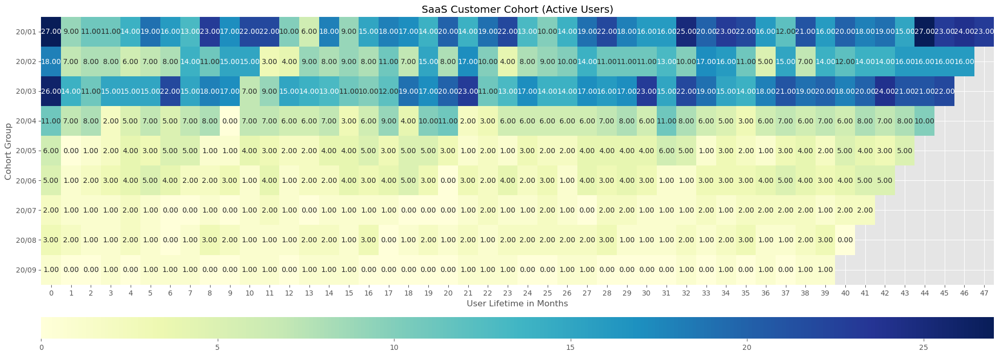

In [14]:
# Active Customers Cohort
full_range = pd.period_range(start=cohort['reg_month'].min(), end=cohort['reg_month'].max(), freq='M')
cohort_pivot = cohort.pivot(index='reg_month', columns='lifetime', values='active').reindex(full_range, fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(nrows=2,ncols=1,figsize=(24, 14),  gridspec_kw={'height_ratios': [20, 1], 'hspace': 0.05})
sns.heatmap(cohort_pivot,annot=True,fmt='.2f',cmap='YlGnBu',ax=ax,cbar_ax=cbar_ax,cbar_kws={'orientation': 'horizontal'})
cbar_ax.set_position([0.125, 0.26, 0.775, 0.03])  # [left, bottom, width, height]
y_labels = [f"{d.year % 100}/{d.month:02d}" for d in full_range]
ax.set_yticklabels(y_labels, rotation=0, fontsize=10)
ax.set(title='SaaS Customer Cohort (Active Users)',xlabel='User Lifetime in Months',ylabel='Cohort Group')
ax.set_aspect(aspect=1.5)

plt.show()

This implies that overall, users who signed up within the first three months of the analysis period are more engaged compared to those who joined later. These early adopters show higher retention and activity levels, suggesting that the initial cohort found more value or remained more invested in the products. This could indicate that initial marketing efforts or product features were more effective at retaining early users, whereas later users may require different engagement strategies to maintain their interest.


##### Monthly Product Active User Performance (2020-2023)

In [15]:
# Make Monthly User Dataframe, differentiated by products and year
products = df['Product'].unique()
years = df['Order Date'].dt.year.unique()

# Create an empty DataFrame to store the results
all_product_year_data = pd.DataFrame()

# Loop over each product and each year
for product in products:
    for year in years:
        # Slice main df by product and year
        product_year_data = df.query(f"Product == '{product}' and year == {year}")
        
        if product_year_data.empty:
            print(f"No data found for {product} in {year}")
            continue
        
        # Perform the existing analysis steps
        product_year_data['reg_date'] = product_year_data.groupby('Customer ID')['Order Date'].transform('min')
        data_user = product_year_data.groupby(['Customer ID', 'Customer'])['reg_date'].min().reset_index()
        data_user['reg_month'] = data_user['reg_date'].dt.to_period('M')
        data_user['key'] = 1
        
        # Create a yearly template table
        yearly_template_table = template_table[template_table['Month'].dt.year == year]
        yearly_template_table['key'] = 1

        # Merge with yearly template
        data_user = yearly_template_table.merge(data_user, on='key').drop('key', axis=1)
        data_user = data_user[data_user['Month'].dt.to_period('M') >= data_user['reg_month']]
        product_year_data['Month'] = product_year_data['Order Date'].values.astype('datetime64[M]')
        sales_month = product_year_data.groupby(['Customer ID', 'Month'])[['Quantity', 'Sales', 'discounted_sales', 'net_profit', 'overall_cost']].sum().reset_index()
        account = product_year_data.groupby(['Customer ID', 'Month'])[['Order ID']].nunique().reset_index()
        account.columns = ['Customer ID', 'Month', 'account']
        data_user = data_user.merge(sales_month, how='left', on=['Customer ID', 'Month'])
        data_user = data_user.merge(account, how='left', on=['Customer ID', 'Month'])
        data_user['user'] = 1
        data_user['new_user'] = (data_user['reg_month'] == data_user['Month'].dt.to_period('M')).astype(int)
        data_user['active'] = (data_user['Sales'] > 0).astype(int)
        data_user['active_prev'] = data_user.sort_values(by='Month').groupby('Customer ID')['active'].shift(1)
        data_user['change_status'] = (data_user['active'] != data_user['active_prev']).astype(int)
        data_user['session_id'] = data_user.sort_values(by='Month').groupby('Customer ID')['change_status'].cumsum()
        data_user['inactive'] = (data_user['active'] == 0).astype(int)
        data_user['month_inactive'] = data_user.sort_values(by='Month').groupby(['Customer ID', 'session_id'])['inactive'].cumsum()
        
        # Aggregate data for monthly and annual report
        data_report = data_user.groupby('Month')[['Quantity', 'account', 'Sales', 'discounted_sales', 'net_profit', 'overall_cost', 'user', 'new_user', 'active']].sum()
        data_report['Product'] = product
        data_report['Year'] = year
        
        # Append to the result DataFrame
        all_product_year_data = pd.concat([all_product_year_data, data_report])

# Reset index
all_product_year_data.reset_index(inplace=True)
# Sort the DataFrame by Product and Month
all_product_year_data_sorted = all_product_year_data.sort_values(by=['Product', 'Month'])

C:\Users\arizk\AppData\Local\Temp\ipykernel_884\1998787959.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  product_year_data['reg_date'] = product_year_data.groupby('Customer ID')['Order Date'].transform('min')
C:\Users\arizk\AppData\Local\Temp\ipykernel_884\1998787959.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yearly_template_table['key'] = 1
C:\Users\arizk\AppData\Local\Temp\ipykernel_884\1998787959.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Data

In [29]:
# To view the data
#pd.set_option('display.max_rows', None)
#all_product_year_data_sorted

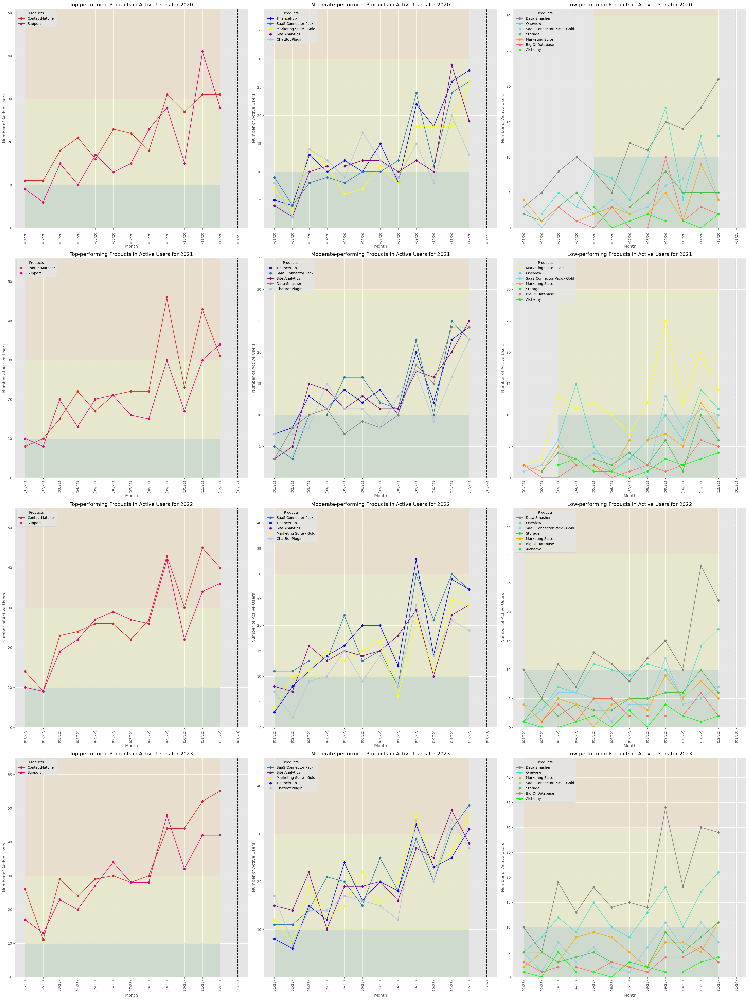

In [16]:
# Create a chart for active users
# Function to calculate total active users for each year
def calculate_total_active_users_by_product(df, year):
    return df[df['Month'].dt.year == year].groupby('Product')['active'].sum().sort_values(ascending=False)

# Function to identify product categories
def identify_product_categories(total_active_users, top_n=2, moderate_n=5, low_n=7):
    top_products = total_active_users.head(top_n).index.tolist()
    moderate_products = total_active_users.iloc[top_n:(top_n+moderate_n)].index.tolist()
    low_products = total_active_users.tail(low_n).index.tolist()
    return top_products, moderate_products, low_products

years = [2020, 2021, 2022, 2023]

# Dictionary to hold product categories for each year based on active users
product_categories_active_users = {year: identify_product_categories(calculate_total_active_users_by_product(all_product_year_data_sorted, year)) for year in years}

# Define hex codes for each product
product_color_map = {
    'Marketing Suite': '#FFA500',         
    'Marketing Suite - Gold': '#FFFF00',  
    'SaaS Connector Pack': '#1f77b4',     
    'SaaS Connector Pack - Gold': '#87CEEB', 
    'FinanceHub': '#0000FF',             
    'Data Smasher': '#808080',               
    'ContactMatcher': '#d62728',              
    'Site Analytics': '#800080',               
    'Big Ol Database': '#FF6961',               
    'ChatBot Plugin': '#B0C4DE',             
    'OneView': '#40E0D0',             
    'Storage': '#4cbb49',              
    'Support': '#E60073',              
    'Alchemy': '#00FF00'               
}

# Create a figure with subplots for each year's top, moderate, and low product groups based on active users
fig, axes = plt.subplots(nrows=len(years), ncols=3, figsize=(30, 10 * 4))

for i, year in enumerate(years):
    yearly_data = all_product_year_data_sorted[all_product_year_data_sorted['Month'].dt.year == year]
    
    top_products, moderate_products, low_products = product_categories_active_users[year]
    
    # Define function to plot products
    def plot_products(ax, products, category, year_data):
        for product in products:
            product_data = year_data[year_data['Product'] == product]
            color = product_color_map.get(product, '#000000')  # Default to black if not found
            ax.plot(product_data['Month'], product_data['active'], label=product, color=color, marker='o')
        
        ax.fill_between(year_data['Month'], 0, 10, color='green', alpha=0.1)
        ax.fill_between(year_data['Month'], 10, 30, color='yellow', alpha=0.1)
        ax.fill_between(year_data['Month'], 30, year_data['active'].max() + 10, color='orange', alpha=0.1)
        ax.axvline(pd.Timestamp(f'{year}-12-31'), color='black', linestyle='--')
        ax.set_xlabel('Month')
        ax.set_ylabel('Number of Active Users')
        ax.set_ylim(0, year_data['active'].max() + 10)
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('(%m/%y)'))
        ax.tick_params(axis='x', rotation=90)
        ax.set_title(f'{category}-performing Products in Active Users for {year}')
        ax.legend(title='Products')
        ax.grid(True)
    
    plot_products(axes[i, 0], top_products, 'Top', yearly_data[yearly_data['Product'].isin(top_products)])
    plot_products(axes[i, 1], moderate_products, 'Moderate', yearly_data[yearly_data['Product'].isin(moderate_products)])
    plot_products(axes[i, 2], low_products, 'Low', yearly_data[yearly_data['Product'].isin(low_products)])

plt.tight_layout()
plt.show()


>Analyzing the active user data reveals various trends in product performance. For the 14 products, active user numbers are categorized into 3 groups (Low, Moderate, and High). Low active user are between 0 - 10 users (green grid), Moderate active user are between 10 to 30 users (yellow grid), while High active user are above 30 users (orange grid). In addition, products are divided into 3 subgroups (Lowest-performing, Moderate-performing, and Top-performing), based on the monthly sum of active users each year. 

Top-Performing Products in Active Users
- ContactMatcher consistently ranks as one of the top-performing products, with a notable increase in active user numbers from 11 in January 2020 to 55 in December 2023. It experiences High engagement peaks in September and November each year.
- Support was with ContactMatcher as the Top-performing 2 products all 4 years. Ever since 2022, its seasonal peaks in November and September has reached High active users numbers, improving from 2020 and 2021. September 2023 records highest active user for the product, at 48 users.

Moderate-Performing Products in Active Users
- FinanceHub has seen moderate growth in active user throughout the years, usually peaking in September and November. Highest peak was in September 2022 with 33 users. In 2023, user engagement remained high, with peaks in September (32) and December (31).
- SaaS Connector Pack has steadily grown its active user base, peaking each year in September and November. Highest recorded peak was in November 2023 with 31 users. In 2023, it maintained high engagement, with significant peaks in both September (29) and November (31).
- Site Analytics has steadily increased its active user numbers over the years, with notable peaks in November and December. In November 2023, it reached High category with 35 active users, a significant rise from the Moderate numbers in previous years.
- Marketing Suite - Gold has steadily increased its active user numbers, peaking each year in September, November, and December. Highest recorded peaks were in September and December 2023 with 34 users. 
- ChatBot Plugin has steadily grown its active user base, peaking each year in September, November, and December. Highest recorded peaks were in September and November 2023, both with 33 users.
- Data Smasher is among the low-performing products in terms of active user numbers, though it performs noticeably higher within that group. In 2021, it was in the moderate-performing category. Active user base has steadily grown, with peaks each year in September, November, and December. Highest recorded peak was in September 2023 with 34 users. 

Low-Performing Products in Active Users
- OneView, along with Data Smasher, have consistently been top product in the Low-performing category. It has steadily increased its active user numbers, with peaks in September, November, and December each year. Highest recorded peak was in December 2023 with 21 users.
- SaaS Connector Pack - Gold has shown low to moderate performance in active user numbers, with peaks in September and November each year. Highest peak was in September 2021 with 13 users. In 2023, it maintained moderate engagement, peaking in September (11) and November (11).
- Marketing Suite, a low-performing product in terms of active users, has seen steady growth throughout the years. Active users peak each year in November, September, and December. Highest peak was in December 2023 with 11 users. In 2023, it maintained consistent engagement with significant peaks in May and December.
- Storage has overall low performance, though it nearly reached the moderate category during its peak periods. Peaks occur each year in September, November, and December, but growth has been minimal. Highest peak was in December 2023 with 11 users. 
- Big Ol Database has consistently shown low performance. It peaks each year in September and November. The highest peak was in September 2020 with 10 users. In 2023, it maintained minimal growth, peaking in November with 6 users.
- In terms of active users, Alchemy has the worst performance out of all products. It has consistently shown low performance, with some months having no active users. Peaks occur each year in September, November, and December. Highest peak was recorded in March 2023 with 5 users. Growth has been minimal.

Overall, most products have peaks of active users toward the end of the year, usually in November and September. Top-performing products' active user numbers seem to be growing throughout the years. Moderate-performing products also show steady growth with significant engagement peaks in the same months. However, low-performing products, while showing some peaks, have minimal growth and lower engagement overall. 

Based on the data provided, none of the products have achieved product-market fit, as indicated by significant fluctuations in active user numbers. Despite some annual growth, there are frequent ups and downs, reflecting instability and a lack of a strong, consistent upward trajectory. While a few products showed notable growth in 2023, further analysis is needed to determine if this growth stems from the products' intrinsic value. Overall, the trends suggest that more work is needed to achieve a stable and strong user base.

#### Monthly Product Revenue Performance (2020-2023)

Typically, SaaS companies use Monthly Recurring Revenue (MRR) and Annual Recurring Revenue (ARR) to measure monthly and annual revenue. However, these metrics are not applicable here due to the absence of subscription data and contracts. Instead, calculating annual and monthly revenue achieves the same objective.

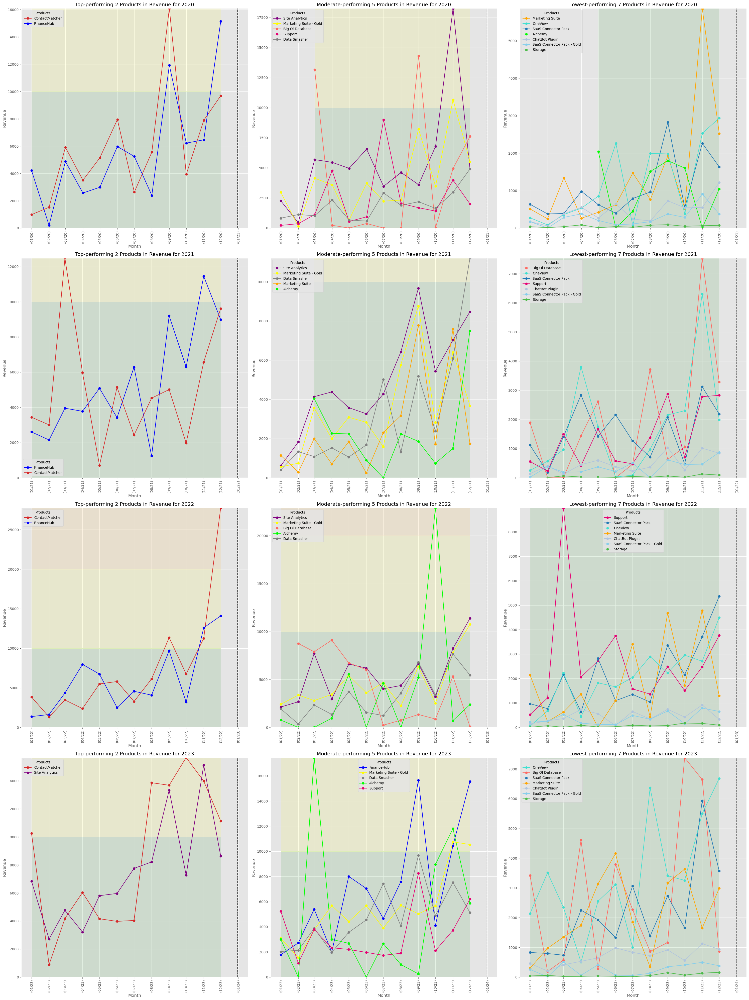

In [38]:
# Product Revenue Performance Chart (2020-2023)
all_product_year_data_sorted['Month'] = pd.to_datetime(all_product_year_data_sorted['Month'], format='%Y-%m')
df_2020 = all_product_year_data_sorted[all_product_year_data_sorted['Month'].dt.year == 2020]
df_2021 = all_product_year_data_sorted[all_product_year_data_sorted['Month'].dt.year == 2021]
df_2022 = all_product_year_data_sorted[all_product_year_data_sorted['Month'].dt.year == 2022]
df_2023 = all_product_year_data_sorted[all_product_year_data_sorted['Month'].dt.year == 2023]

# Calculate total Revenue for each product in 2020
total_sales_by_product_2020 = df_2020.groupby('Product')['discounted_sales'].sum().sort_values(ascending=False)

# Calculate total Revenue for each product in 2021
total_sales_by_product_2021 = df_2021.groupby('Product')['discounted_sales'].sum().sort_values(ascending=False)

# Calculate total Revenue for each product in 2022
total_sales_by_product_2022 = df_2022.groupby('Product')['discounted_sales'].sum().sort_values(ascending=False)

# Calculate total Revenue for each product in 2023
total_sales_by_product_2023 = df_2023.groupby('Product')['discounted_sales'].sum().sort_values(ascending=False)

# Identify top 2, moderate 5, and lowest 7 products in Revenue for 2020
top_2_products_2020 = total_sales_by_product_2020.head(2).index.tolist()
moderate_5_products_2020 = total_sales_by_product_2020.iloc[2:7].index.tolist()
lowest_7_products_2020 = total_sales_by_product_2020.tail(7).index.tolist()

# Identify top 2, moderate 5, and lowest 7 products in Revenue for 2021
top_2_products_2021 = total_sales_by_product_2021.head(2).index.tolist()
moderate_5_products_2021 = total_sales_by_product_2021.iloc[2:7].index.tolist()
lowest_7_products_2021 = total_sales_by_product_2021.tail(7).index.tolist()

# Identify top 2, moderate 5, and lowest 7 products in Revenue for 2022
top_2_products_2022 = total_sales_by_product_2022.head(2).index.tolist()
moderate_5_products_2022 = total_sales_by_product_2022.iloc[2:7].index.tolist()
lowest_7_products_2022 = total_sales_by_product_2022.tail(7).index.tolist()

# Identify top 2, moderate 5, and lowest 7 products in Revenue for 2023
top_2_products_2023 = total_sales_by_product_2023.head(2).index.tolist()
moderate_5_products_2023 = total_sales_by_product_2023.iloc[2:7].index.tolist()
lowest_7_products_2023 = total_sales_by_product_2023.tail(7).index.tolist()

# Define hex codes for each product
product_color_map = {
    'Marketing Suite': '#FFA500',         
    'Marketing Suite - Gold': '#FFFF00',  
    'SaaS Connector Pack': '#1f77b4',     
    'SaaS Connector Pack - Gold': '#87CEEB', 
    'FinanceHub': '#0000FF',             
    'Data Smasher': '#808080',               
    'ContactMatcher': '#d62728',              
    'Site Analytics': '#800080',               
    'Big Ol Database': '#FF6961',               
    'ChatBot Plugin': '#B0C4DE',             
    'OneView': '#40E0D0',             
    'Storage': '#4cbb49',              
    'Support': '#E60073',              
    'Alchemy': '#00FF00'               
}

# Create a single figure with subplots for each year's top, moderate, and low product groups
fig, axes = plt.subplots(nrows=len([2020, 2021, 2022, 2023]), ncols=3, figsize=(30, 10 * 4))

for i, year in enumerate([2020, 2021, 2022, 2023]):
    yearly_data = all_product_year_data_sorted[all_product_year_data_sorted['Month'].dt.year == year]
    
    top_2_products = globals()[f"top_2_products_{year}"]
    moderate_5_products = globals()[f"moderate_5_products_{year}"]
    lowest_7_products = globals()[f"lowest_7_products_{year}"]
    
    # Plot for the top 2 products
    ax1 = axes[i, 0]
    top_2_year_data = yearly_data[yearly_data['Product'].isin(top_2_products)]
    for product in top_2_products:
        product_data = top_2_year_data[top_2_year_data['Product'] == product]
        color = product_color_map.get(product, '#000000')  # Default to black if not found
        ax1.plot(product_data['Month'], product_data['discounted_sales'], label=product, color=color, marker='o')
    # Fill the areas with specified transparency
    ax1.fill_between(top_2_year_data['Month'], 0, 10000, color='green', alpha=0.1)
    ax1.fill_between(top_2_year_data['Month'], 10000, 20000, color='yellow', alpha=0.1)
    ax1.fill_between(top_2_year_data['Month'], 20000, top_2_year_data['discounted_sales'].max() + 10, color='orange', alpha=0.1)
    ax1.axvline(pd.Timestamp(f'{year}-12-31'), color='black', linestyle='--')
    ax1.set_xlabel('Month')
    ax1.set_ylabel('Revenue')
    ax1.set_ylim(0, top_2_year_data['discounted_sales'].max() + 10)
    ax1.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('(%m/%y)'))
    ax1.tick_params(axis='x', rotation=90)
    ax1.set_title(f'Top-performing 2 Products in Revenue for {year}')
    ax1.legend(title='Products')
    ax1.grid(True)
    
    # Plot for the moderate 5 products
    ax2 = axes[i, 1]
    moderate_5_year_data = yearly_data[yearly_data['Product'].isin(moderate_5_products)]
    for product in moderate_5_products:
        product_data = moderate_5_year_data[moderate_5_year_data['Product'] == product]
        color = product_color_map.get(product, '#000000')  # Default to black if not found
        ax2.plot(product_data['Month'], product_data['discounted_sales'], label=product, color=color, marker='o')
    # Fill the areas with specified transparency
    ax2.fill_between(moderate_5_year_data['Month'], 0, 10000, color='green', alpha=0.1)
    ax2.fill_between(moderate_5_year_data['Month'], 10000, 20000, color='yellow', alpha=0.1)
    ax2.fill_between(moderate_5_year_data['Month'], 20000, moderate_5_year_data['discounted_sales'].max() + 10, color='orange', alpha=0.1)
    ax2.axvline(pd.Timestamp(f'{year}-12-31'), color='black', linestyle='--')
    ax2.set_xlabel('Month')
    ax2.set_ylabel('Revenue')
    ax2.set_ylim(0, moderate_5_year_data['discounted_sales'].max() + 10)
    ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('(%m/%y)'))
    ax2.tick_params(axis='x', rotation=90)
    ax2.set_title(f'Moderate-performing 5 Products in Revenue for {year}')
    ax2.legend(title='Products')
    ax2.grid(True)
    
    # Plot for the lowest 7 products
    ax3 = axes[i, 2]
    lowest_7_year_data = yearly_data[yearly_data['Product'].isin(lowest_7_products)]
    for product in lowest_7_products:
        product_data = lowest_7_year_data[lowest_7_year_data['Product'] == product]
        color = product_color_map.get(product, '#000000')  # Default to black if not found
        ax3.plot(product_data['Month'], product_data['discounted_sales'], label=product, color=color, marker='o')
    # Fill the areas with specified transparency
        
    ax3.fill_between(lowest_7_year_data['Month'], 0, 10000, color='green', alpha=0.1)
    ax3.fill_between(lowest_7_year_data['Month'], 10000, 20000, color='yellow', alpha=0.1)
    ax3.fill_between(lowest_7_year_data['Month'], 20000, lowest_7_year_data['discounted_sales'].max() + 10, color='orange', alpha=0.1)
    ax3.axvline(pd.Timestamp(f'{year}-12-31'), color='black', linestyle='--')
    ax3.set_xlabel('Month')
    ax3.set_ylabel('Revenue')
    ax3.set_ylim(0, lowest_7_year_data['discounted_sales'].max() + 10)
    ax3.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    ax3.xaxis.set_major_formatter(mdates.DateFormatter('(%m/%y)'))
    ax3.tick_params(axis='x', rotation=90)
    ax3.set_title(f'Lowest-performing 7 Products in Revenue for {year}')
    ax3.legend(title='Products')
    ax3.grid(True)

plt.tight_layout()
plt.show()


>To make analysis easier, revenue numbers are categorized into 3 groups (Low, Moderate, and High). Low revenue are between 0 - 10.000 dollars (green grid), Moderate revenue are between 10.000 to 20.000 dollars (yellow grid), while High revenue are above 20.000 dollars (orange grid). In addition, products are divided into 3 subgroups (Lowest-performing, Moderate-performing, and Top-performing-performing), based on the monthly sum from each year. 

Top-Performing Products in Revenue
- ContactMatcher has consistently been among the Top-performing 2 products in revenue across all years, with its occasional monthly moderate revenue. However, revenue numbers have dropped in 2023, as it's highest performance was in December 2022 as revenue reached High category (the only time it did so).
- FinanceHub was with ContactMatcher as the Top-performing 2 products for three years, but in 2023 it's position was replaced by Site Analytics, which had moved from low revenue to moderate by the end of 2023. 

Moderate-Performing Products in Revenue
- Alchemy's revenue was on the Lowest-performing product group in 2020, but made its way to Moderate-performing category with significant peaks. At one point in October 2022, Alchemy peaked into High revenue category despite having other months in the lower end. Peaks for Alchemy are inconsistent periodically, which signals complex sales processes with longer cycles and higher-value deals.
- Marketing Suite - Gold has consistently been Moderate-performing with low revenue. However, it seems to have been improving consistently across the years at a slow pace.
- Like Marketing Suite - Gold, Data Smasher also has consistently been Moderate-performing with low revenue. It's overall revenue seems to be improving at a slow pace.
- Big Ol Database, like Alchemy, shows periodic inconsistency, reflecting complex sales processes with longer cycles and higher-value deals. Its performance has varied between moderate and low, with occasional peaks that far exceed its usual monthly performance. Its peak performance was in 2020, reaching around $14,000, a level not seen in subsequent years.
- Support has fluctuated between moderate and low performance over the years. Initially is was Moderate-performing in 2020, then became a Low-performing product in 2021 and 2022. In 2023, it was back at Moderate-performing. With the exception of 2021, it is relatively consistent product in terms of revenue, with one high peak each year reaching at around 8000 dollars.

Low-Performing Products in Revenue
- The standard Marketing Suite had been fluctuating in revenue. In 2021, it was on the Moderate-performing category, as revenue peaked in September dan November at almost around the 8000 dollars mark (still below the Gold version). Following this, in 2022 and 2023, revenue has been on the decline, reaching just above 4000 dollars during its best months and 0 at its worst.
- OneView has consistently been on the Low-performing group in terms of revenue; however it is one of the best in the group. It has shown steady improvements throught the years, and by 2023 it has overtook the standard Marketing Suite during its end-of-year peaks at above 6000 dollars.
- The standard SaaS Connector Pack has been improving across the years. Initially, it averages around 1000 dollars monthly during 2020, and by 2023 it has averaged to around 3000 dollars monthly.
- ChatBot Plugin has consistently been at the low end, with around 500 dolars in revenue monthly. Condition has slightly improved in 2023, with revenue reaching for 1000 dollars by mid to end of the year. 
- Saas Connector Pack - Gold has consistently been at the low end, only above Storage, in terms of revenue. It shows worsening across the years.
- Storage has consistently been at the lowest end of all the product line in terms of revenue, with no seasonal peaks and improvement across the years. 

Overall, product performance has varied over the years, with no consistent upward trend. High revenue performance has been rare, with outliers being ContactMatcher in December 2022 and Alchemy in October 2022. Even the best products primarily remained in the low revenue territory, occasionally reaching moderate levels in some months. This implies that the majority of the products have struggled to achieve consistent high revenue, indicating a need for strategic adjustments to improve and stabilize revenue growth.

#### Product Annual Revenue

In [18]:
revenue_by_product = df.groupby(['year', 'Product'])['discounted_sales'].sum().unstack()
revenue_by_product

Product,Alchemy,Big Ol Database,ChatBot Plugin,ContactMatcher,Data Smasher,FinanceHub,Marketing Suite,Marketing Suite - Gold,OneView,SaaS Connector Pack,SaaS Connector Pack - Gold,Site Analytics,Storage,Support
year,,,,,,,,,,,,,,
2020,8441.8308,40660.6715,5550.6156,70831.8244,23065.0496,68238.4726,16476.8091,47689.3476,14258.9367,12418.1268,3348.5580,67033.4308,592.4304,28084.5988
2021,23283.5140,22630.4075,5844.0692,60872.8001,38250.0720,64435.5899,30523.9209,41776.7264,21178.0481,18962.3136,4301.6184,59115.0404,498.4592,15998.7440
2022,43103.4788,47136.1354,5565.6456,88859.7696,39423.7372,72831.4625,21796.4987,55401.0264,24219.7769,25422.3504,4504.1060,66130.1020,892.3692,32421.4300
2023,56699.4760,32045.4351,8337.6312,101876.5945,56839.4576,84965.7395,25282.1765,65778.5380,40385.0996,26193.4204,3148.1292,89635.5416,800.7332,40560.8384


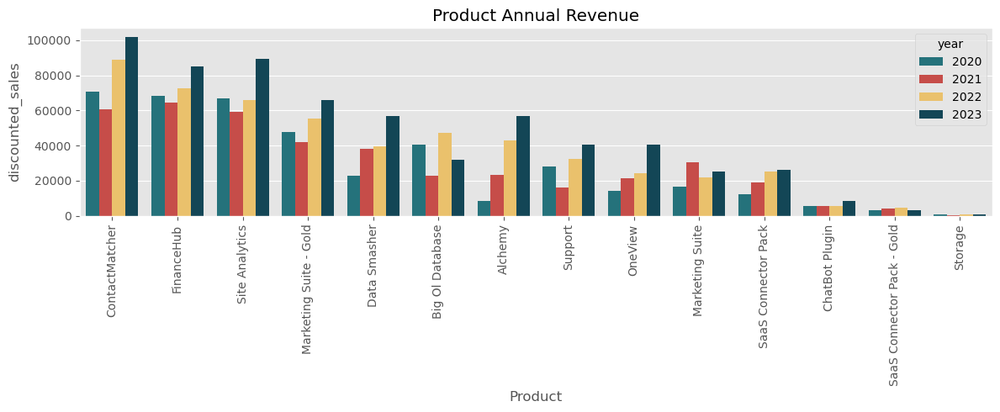

In [19]:
# Annual Revenue Chart for All Products
annual_revenue = pd.DataFrame(df.groupby(['Product', 'year'])['discounted_sales'].sum()).reset_index()
total_sales = annual_revenue.groupby('Product')['discounted_sales'].sum().reset_index()
sorted_products = total_sales.sort_values(by='discounted_sales', ascending=False)['Product']

# Reorder products in the annual_revenue DataFrame
annual_revenue['Product'] = pd.Categorical(annual_revenue['Product'], categories=sorted_products, ordered=True)
annual_revenue = annual_revenue.sort_values(by='Product')

plt.figure(figsize=(12, 5))
sns.barplot(data=annual_revenue, x='Product', y='discounted_sales', hue='year', palette=['#177e89', '#db3a34', '#ffc857', '#084c61'])
plt.xticks(rotation=90)
plt.title('Product Annual Revenue')

plt.tight_layout()
plt.show()

##### Product Revenue Growth

>"Businesses need to keep an eye on their product growth rates. It's like watching a heartbeat; it tells you how the product is doing. If it's slowing down, pump it with some marketing to keep it alive. If it starts to fade, innovate or update it to spark new interest. If it's really on the way out, start planning its exit and shift focus to the next big thing. This isn't just about saving money; it's about staying ahead and adapting to what customers want. By understanding these patterns, businesses can make smart decisions and keep growing." - Steve Jobs AI

To accurately measure product growth rates, the Annual Average Growth Rate (AAGR) and the Compound Annual Growth Rate (CAGR) will be used. AAGR provides an average growth rate over time, useful for quick assessments but less reliable during fluctuations because it doesn't consider compounding; it overlooks the impact of earning returns on previous earnings, leading to potentially less accurate growth estimates during variable periods. On the other hand, CAGR accounts for compounding, providing a clearer picture of consistent growth, although it assumes a constant growth rate.

Neither AAGR nor CAGR directly considers risk. To incorporate risk, businesses often use metrics such as Standard Deviation, Variance, or the Sharpe Ratio, which adjust returns for risk to provide a better sense of risk-adjusted performance. However, calculating these requires detailed financial data, such as volatility measures and historical prices, which the fictional dataset lacks. 

In [20]:
# Product Revenue Growth Rate

revenue_by_product = revenue_by_product.reset_index()
# Calculate beginning balance for 2020 and year difference
yearly_revenue = revenue_by_product.melt(id_vars=['year'], var_name='Product', value_name='discounted_revenue')
beginning_balance = yearly_revenue[yearly_revenue['year'] == 2020][['Product', 'discounted_revenue']]
beginning_balance.columns = ['Product', 'beginning balance']
# Merge beginning balance back to yearly_revenue
yearly_revenue = yearly_revenue.merge(beginning_balance, on='Product')
yearly_revenue['year difference'] = yearly_revenue['year'] - 2020
# Calculate CAGR
yearly_revenue['CAGR'] = np.power(yearly_revenue['discounted_revenue'] / yearly_revenue['beginning balance'], 
(1 / yearly_revenue['year difference'])) - 1
yearly_revenue['CAGR'] = yearly_revenue['CAGR'] * 100
# Calculate cumulative sum and AAGR
yearly_revenue = yearly_revenue.sort_values(by=['Product', 'year'])
yearly_revenue['yearly_growth_rate'] = yearly_revenue.groupby('Product')['discounted_revenue'].pct_change() * 100
yearly_revenue['growth rate cum sum'] = yearly_revenue.groupby('Product')['yearly_growth_rate'].cumsum()
yearly_revenue['AAGR'] = yearly_revenue['growth rate cum sum'] / yearly_revenue['year difference']
# Drop intermediate columns
yearly_revenue.drop(['growth rate cum sum', 'year difference', 'beginning balance'], axis=1, inplace=True)
# Calculate final AAGR and CAGR for each product
final_growth_rates = yearly_revenue.groupby('Product').agg({'AAGR': 'last', 'CAGR': 'last'}).reset_index()

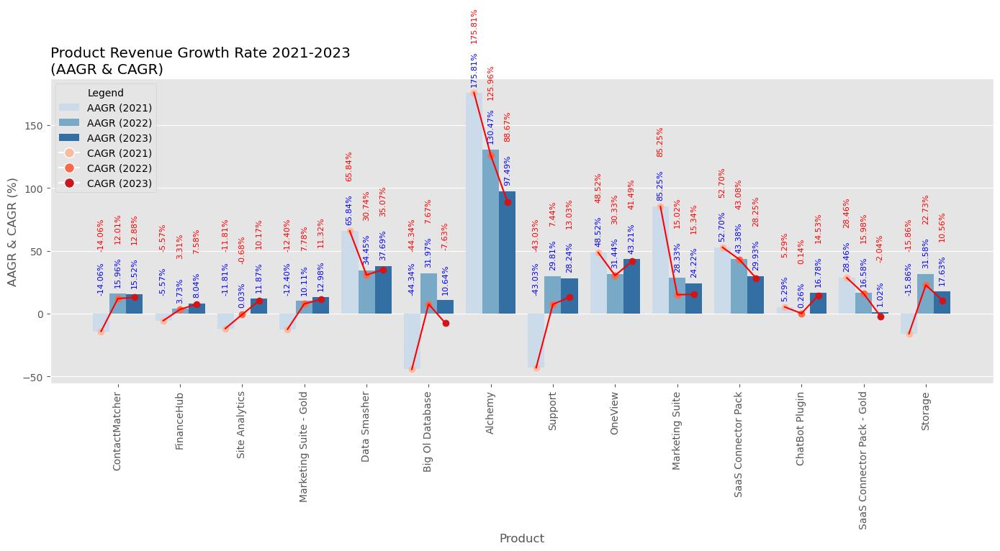

In [21]:
# Charting Product Growth Rate using Annual Average Growth Rate (AAGR) & Compounded Annual Growth Rate (CAGR)

chart_data = yearly_revenue[yearly_revenue['year'] != 2020]

# Set the order of the products, Top, Moderate, Low-performing
product_order = ['ContactMatcher', 'FinanceHub', 'Site Analytics', 'Marketing Suite - Gold', 'Data Smasher', 
                 'Big Ol Database', 'Alchemy', 'Support', 'OneView', 'Marketing Suite', 'SaaS Connector Pack', 
                 'ChatBot Plugin', 'SaaS Connector Pack - Gold', 'Storage']
# Progressive color palette 
blue_palette = sns.color_palette("Blues", 3)
red_palette = sns.color_palette("Reds", 3)  # Red palette for dots
# Create the figure for AAGR
fig, ax1 = plt.subplots(figsize=(14, 8))
# AAGR bar plot
sns.barplot(x='Product', y='AAGR', hue='year', data=chart_data, palette=blue_palette, order=product_order, ax=ax1)
ax1.set_title('Product Revenue Growth Rate 2021-2023\n(AAGR & CAGR)', loc='left')
ax1.set_xlabel('Product')
ax1.set_ylabel('AAGR & CAGR (%)')
ax1.tick_params(axis='x', rotation=90)

# Annotate bars with CAGR values as red dots with horizontal offset and connect them with lines
offset = [-0.27, 0, 0.27]  # Offsets for each year to spread the dots
for i, product in enumerate(product_order):
    cagr_values = []
    for j, year in enumerate(chart_data['year'].unique()):
        product_data = chart_data[(chart_data['Product'] == product) & (chart_data['year'] == year)]
        if not product_data.empty:
            y_pos = product_data['AAGR'].values[0]
            cagr_value = product_data['CAGR'].values[0]
            x_pos = i + offset[j]  # Apply horizontal offset
            ax1.plot(x_pos, cagr_value, 'o', color=red_palette[j])  # Red dot annotation with different shades
            cagr_values.append((x_pos, cagr_value))

    if len(cagr_values) > 1:
        cagr_values.sort()  # Ensure the points are connected in the correct order
        x_vals, y_vals = zip(*cagr_values)
        ax1.plot(x_vals, y_vals, 'r-')

# Add separate text annotations above the bar chart
for i, product in enumerate(product_order):
    product_data = chart_data[chart_data['Product'] == product]
    for j, year in enumerate(chart_data['year'].unique()):
        aagr_value = product_data[product_data['year'] == year]['AAGR'].values[0]
        cagr_value = product_data[product_data['year'] == year]['CAGR'].values[0]
        x_pos = i + offset[j]  # Apply horizontal offset for text as well
        text_y_pos = aagr_value if aagr_value > 0 else 10  # Position text at 10 if AAGR is negative
        # Create the annotation text 
        annotation = f'{aagr_value:.2f}%\n{cagr_value:.2f}%'
        # Add AAGR value in blue and CAGR value in red with custom positioning
        ax1.text(x_pos, text_y_pos + 5, f'{aagr_value:.2f}%', ha='center', va='bottom', color='blue', rotation=90, fontsize=8)
        ax1.text(x_pos, text_y_pos + 40, f'{cagr_value:.2f}%', ha='center', va='bottom', color='red', rotation=90, fontsize=8)

# Custom legend
handles, labels = ax1.get_legend_handles_labels()
handles = handles[:3]  # Only keep bar legend handles
for i in range(3):
    handles[i].set_label(f'AAGR ({2021 + i})')
handles += [plt.Line2D([0], [0], marker='o', color='w', label=f'CAGR ({2021 + i})', markerfacecolor=red_palette[i], markersize=10) for i in range(3)]
labels = [f'AAGR ({2021 + i})' for i in range(3)] + [f'CAGR ({2021 + i})' for i in range(3)]
ax1.legend(handles=handles, labels=labels, title='Legend', loc='upper left')

plt.tight_layout()
plt.show()


>From the chart above and the previous analysis, we can deduce insights by categorizing the products into Low-performing, Moderate-performing, and Top-performing based on their yearly revenue.

(Top-performing: Contactmatcher, FinanceHub, Site Analytics)
- In 2021, the top-performing products experienced negative growth rates. However, they all managed to recover by 2022 and continued to grow in 2023, indicating that these products were not in decline in terms of revenue.
- ContactMatcher shows slower growth in revenue, from (AAGR 15.96%, CAGR 12.01%) in 2022 to (AAGR 15.52%, CAGR 12.88%). This indicate that it is a mature product, reaching its peak in terms of market penetration and starts to see diminishing returns from marketing efforts.
- FinanceHub is maturing, marked by a steady and positive growth rate. After a decline with an AAGR and CAGR of -5.57% in 2021, it saw slight recovery with 3.73% AAGR and 3.31% CAGR in 2022. By 2023, growth improved to an AAGR of 8.04% and a CAGR of 7.58%, indicating consistent, but slower positive growth.
- Site Analytics faced a major decline in 2021 with an AAGR and CAGR of -11.81%. However, it improved in 2022 with an AAGR of 0.03% and a CAGR of -0.68%, and showed strong, consistent growth in 2023 with an AAGR of 11.87% and a CAGR of 10.17%. It has surpassed FinanceHub in performance, suggesting it has not yet reached its full potential and there is still an untapped market.

(Moderate-performing: Marketing Suite - Gold, Data Smasher, Big Ol Database, Alchemy, Support)
- Unlike the top-performing products, which show similar trends, the moderate-performing products reflect different stages of product life cycles. These range from strong growth to stabilization and decline. Some products started with declines but then stabilized and matured. Others experienced rapid growth, showing strong market potential, while a few faced inconsistent recovery, hinting at possible market decline.
- Like the Top-performing products, Marketing Suite - Gold initially saw a decline in 2021 (AAGR -12.40%, CAGR -12.40%), but manage to recover in 2022 (AAGR 10.11%, CAGR 7.78%), and showed further (but slower) growth in 2023 (AAGR 12.98%, CAGR 11.32%), indicating stability and maturity.
- Data Smasher's consistently high growth rates—(AAGR 65.84%, CAGR 65.84%) in 2021, (AAGR 34.45%, CAGR 30.74%) in 2022, and (AAGR 37.69%, CAGR 35.07%) in 2023—indicate rapid expansion. It has not reached market saturation or shown signs of decline, suggesting it is in a strong growth phase.
- Big Ol Database appears to be in a declining phase. It experienced a significant decline in 2021 with (AAGR -44.34%, CAGR -44.34%), followed by a recovery in 2022 with (AAGR 31.97%, CAGR 7.67%). However, growth slowed in 2023 with (AAGR 10.64%, CAGR -7.63%). This pattern suggests that while there was an initial recovery, the overall trend points towards a loss of market position and challenges in maintaining consistent growth, indicating a decline.
- Alchemy has had the highest growth rates among all products, indicating a strong growth phase. In 2021, it had an AAGR and CAGR of 175.81%, followed by (AAGR 130.47%, CAGR 125.96%) in 2022, and (AAGR 97.49%, CAGR 88.67%) in 2023. These high growth rates signify rapid expansion. However, the growth rate is gradually reducing, suggesting a decelerating trajectory. Despite this slowdown, Alchemy has not yet reached market saturation, nor does it show the negative growth or revenue decline characteristic of a declining product.
- Support appears to be in a maturing phase. After experiencing a significant decline in 2021 with (AAGR -43.03%, CAGR -43.03%), it showed consistent recovery in 2022 with (AAGR 29.81%, CAGR 7.44%) and in 2023 with (AAGR 28.24%, CAGR 13.04%). These positive but slowing growth rates suggest that Support is stabilizing and reaching its market saturation point, where the majority of potential customers have already been acquired.

(Low-performing: OneView, Marketing Suite, SaaS Connector Pack, ChatBot Plugin, SaaS Connector Pack - Gold, Storage)
- Low-performing products show trends of decline and maturity. Several products exhibit minimal growth rates, needing immediate strategic innovation. 
- OneView is maturing, with growth rates slowing down: (AAGR 48.52%, CAGR 48.52%) in 2021, (AAGR 31.44%, CAGR 30.33%) in 2022, and (AAGR 43.21%, CAGR 41.49%) in 2023. This deceleration suggests approaching market saturation and stable customer base, indicating robust market potential and the need for innovation to sustain growth.
- Standard Marketing Suite shows signs of maturity and a notable performance decline over time. Initially, it experienced rapid growth with high rates in 2021 (AAGR 85.25%, CAGR 85.25%). However, growth decelerated in the following years, dropping to (AAGR 28.33%, CAGR 15.02%) in 2022 and (AAGR 24.22%, CAGR 15.34%) in 2023. This indicates market saturation and struggles to maintain its position. To sustain its relevance and potentially reignite growth, strategic changes and continued innovation will be crucial.
- Standard SaaS Connector Pack is also showing signs of market saturation, with growth rates slowing down: (AAGR 52.70%, CAGR 52.70%) in 2021, (AAGR 43.38%, CAGR 43.08%) in 2022, and (AAGR 29.93%, CAGR 28.25%) in 2023. This trend indicates that most potential customers have been reached, leading to stable but slightly varying revenue. To maintain relevance and foster future growth, innovation and strategic efforts are essential.
- ChatBot Plugin experienced minimal growth in 2021 (AAGR 5.29%, CAGR 5.29%) and 2022 (AAGR 0.26%, CAGR 0.14%), followed by a significant rebound in 2023 (AAGR 16.78%, CAGR 14.53%). This pattern suggests initial stagnation or challenges, but a strong recovery in 2023 indicates growing demand and potential for continued growth with further innovation.
- SaaS Connector Pack - Gold is showing signs of decline. Initially, it experienced strong growth in 2021 (AAGR 28.46%, CAGR 28.46%), which decelerated in 2022 (AAGR 16.58%, CAGR 15.98%). By 2023, growth nearly halted, with AAGR at 1.02% and CAGR turning negative (-2.04%), indicating market saturation and the need for strategic innovation to rejuvenate growth.
- Storage has shown varied performance, declining in 2021 (AAGR -15.86%, CAGR -15.86%), rebounding in 2022 (AAGR 31.58%, CAGR 22.73%), and maintaining positive growth in 2023 (AAGR 17.63%, CAGR 10.56%). Despite this recovery, it consistently ranks at the lowest end of the product line in terms of revenue, highlighting the need for continued innovation to boost its market position

To summarize which products are driving revenue growth, Site Analytics and Data Smasher are at the forefront. Site Analytics exhibited strong and consistent growth throughout 2023, while Data Smasher rapidly expanded with impressive growth rates. Alchemy also demonstrated notable growth, although it has been decelerating. ContactMatcher and Support are stabilizing and seem to be reaching market maturity. On the other hand, FinanceHub shows a steady recovery and positive growth trends. Among the low-performing products, OneView and the Standard SaaS Connector Pack are approaching market saturation, which indicates a need for innovation to sustain future growth.


### **3.2. Profitability**
How does cost compare to revenue? What is the overall profitability of the company? How does the net profit compare to previous periods?  Are there any trends or patterns in net profit that need addressing? What are the profit margins of products? Are the margins growing or declining?

Profit, known as the bottom line, is the net earnings of a company after deducting all expenses, including the cost of producing and marketing goods, from total revenue. While revenue emphasizes a company's ability to generate sales and income, profit highlights its efficiency in managing expenses. In essence, profit reflects how well a company converts revenue into earnings, showcasing its overall financial health and operational efficiency.

In the dataset, the profit data available is `net_profit`. This is different from "gross profit", which is the revenue minus the cost of goods sold (COGS). Gross profit does not account for other operating expenses like administrative costs, marketing, or taxes. Using net profit provides a more complete picture of overall profitability. However, using net profit in the analysis means that profitability can be influenced by non-operational factors such as taxes, interest, and one-time expenses. These factors can introduce variability, making it harder to isolate the core operational performance.

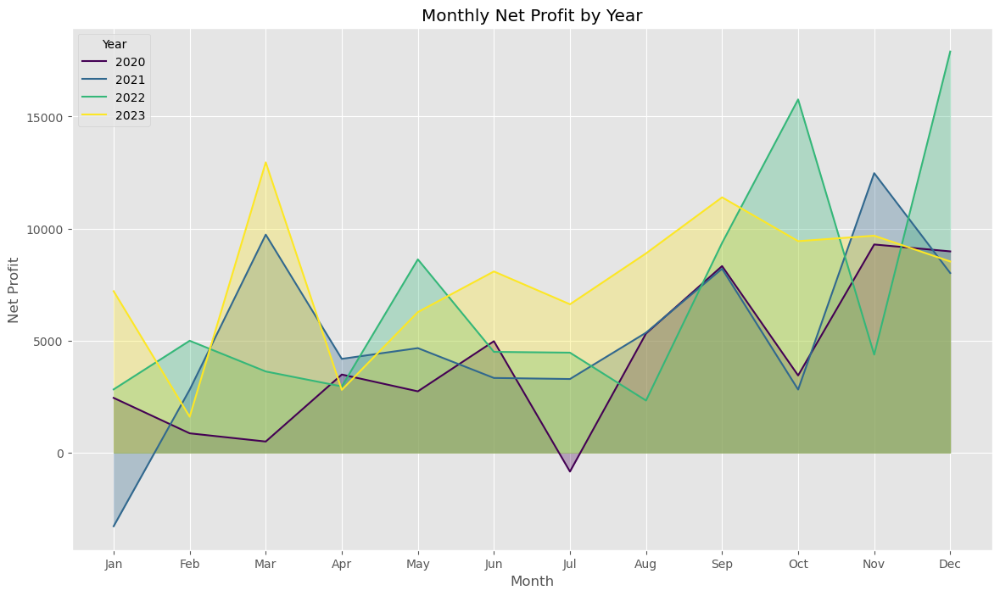

In [41]:
df_grouped = df.groupby(['month', 'year']).agg({'net_profit': 'sum'}).reset_index()
df_pivot = df_grouped.pivot(index='month', columns='year', values='net_profit').fillna(0)

# Plotting
plt.figure(figsize=(14, 8))
colors = plt.cm.viridis(np.linspace(0, 1, df_pivot.shape[1]))

for i, year in enumerate(df_pivot.columns):
    plt.plot(df_pivot.index, df_pivot[year], label=str(year), color=colors[i])
    plt.fill_between(df_pivot.index, df_pivot[year], color=colors[i], alpha=0.3)

plt.title('Monthly Net Profit by Year')
plt.xlabel('Month')
plt.ylabel('Net Profit')
plt.legend(title='Year')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()


- Negative net profits can be observed in July 2020 (-841.4826) and January 2021 (-3281.0070). This indicates that the company faced significant challenges during the early years, possibly due to higher expenses or lower revenues.
- Highest profit in 2022 was driven by significant sales peaks in October (15763.3797) and December (17902.7301). October 2022 was unique as it was the only period across all years to have a peak in October. This suggests that specific events, promotions, or market conditions in these months contributed to unusually high revenue and profit. Understanding these factors can help replicate similar successes in future years.
- Although the profit peaks in 2023 were lower than in 2022, the overall profit was more stable. For example, March (12,957.8999), September (11,395.4394), and August (8,894.4486) showed strong performance. This stability suggests the company has improved cost control and operational efficiency, which is beneficial for long-term financial health and reduces volatility compared to previous years.

#### Annual Net Profit & Growth

In [47]:
yearly_net_profit = df.groupby('year')['net_profit'].sum().reset_index()
yearly_net_profit

,year,net_profit
0,2020,49543.9741
1,2021,61618.6037
2,2022,81726.9308
3,2023,93507.5131


In [43]:
yearly_net_profit_growth=pd.DataFrame(df.groupby(['year'])['net_profit'].sum()).reset_index()
yearly_net_profit_growth['YoY'] = yearly_net_profit_growth['net_profit'].pct_change() * 100
yearly_net_profit_growth['YoY'] = yearly_net_profit_growth['YoY'].fillna(0)
yearly_cost=pd.DataFrame(df.groupby(['year'])['overall_cost'].sum()).reset_index()
yearly_net_profit_growth

,year,net_profit,YoY
0,2020,49543.9741,0.0000
1,2021,61618.6037,24.3715
2,2022,81726.9308,32.6335
3,2023,93507.5131,14.4146


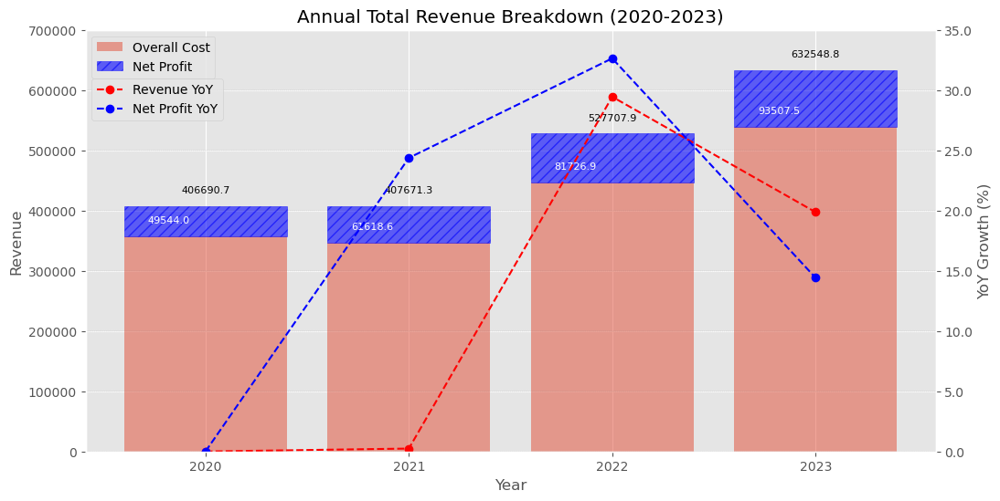

In [39]:
# Yearly Revenue & Growth Chart (with Net Profit)
yearly_revenue_growth['net_profit'] = yearly_net_profit['net_profit']
yearly_revenue_growth['Net Profit YoY'] = yearly_net_profit_growth['YoY']
yearly_revenue_growth['overall_cost'] = yearly_cost['overall_cost'] 
yearly_revenue_growth.rename(columns={'YoY': 'Revenue YoY'}, inplace=True)
#----------------------------------------------------------------------------
fig, ax1 = plt.subplots(figsize=(12, 6))
overall_cost_bars = ax1.bar(yearly_revenue_growth['year'], yearly_revenue_growth['overall_cost'], alpha=0.5, label='Overall Cost')
net_profit_bars = ax1.bar(yearly_revenue_growth['year'], yearly_revenue_growth['net_profit'], bottom=yearly_revenue_growth['overall_cost'],
       color='blue', alpha=0.6, edgecolor='blue', hatch='///', label='Net Profit')
ax1.set_xlabel('Year')
ax1.set_ylabel('Revenue')
ax1.set_title('Annual Total Revenue Breakdown (2020-2023)')
ax1.legend(loc='upper left')
ax1.set_xticks([2020, 2021, 2022, 2023])
ax1.set_xticklabels(['2020', '2021', '2022', '2023'])
ax1.set_ylim(0, 700000)
for i, bar in enumerate(net_profit_bars):
    # The total height of the stacked bar
    total_height = yearly_revenue_growth['overall_cost'][i] + yearly_revenue_growth['net_profit'][i]
    value = yearly_revenue_growth['discounted_sales'][i]
    ax1.annotate(format(value, '.1f'), 
                (bar.get_x() + bar.get_width() / 2., total_height),
                ha='center', va='bottom', 
                xytext=(0, 9),
                fontsize=8, 
                textcoords='offset points')
for i, bar in enumerate(overall_cost_bars):
    value = yearly_revenue_growth['net_profit'][i]
    ax1.annotate(format(value, '.1f'), 
                (bar.get_x() + bar.get_width() / 2., yearly_revenue_growth['overall_cost'][i]),
                ha='center', va='bottom', 
                xytext=(-29, 9),
                color='white',
                fontsize=8, 
                textcoords='offset points')
ax2 = ax1.twinx()
scale_factor = (5 / 100000)
scaled_revenue_yoy = yearly_revenue_growth['Revenue YoY'] / scale_factor
scaled_net_profit_yoy = yearly_revenue_growth['Net Profit YoY'] / scale_factor
ax2.plot(yearly_revenue_growth['year'], scaled_revenue_yoy, 'r--o', label='Revenue YoY')
ax2.plot(yearly_revenue_growth['year'], scaled_net_profit_yoy, 'b--o', label='Net Profit YoY')
ax2.set_ylabel('YoY Growth (%)')
ax2.set_ylim(0, max(max(scaled_revenue_yoy), max(scaled_net_profit_yoy)))
primary_ticks = ax1.get_yticks()
secondary_ticks = [tick * scale_factor for tick in primary_ticks]
ax2.set_yticks(primary_ticks)
ax2.set_yticklabels(secondary_ticks)
ax2.grid(True, which='both', color='grey', linestyle='--', linewidth=0.3, alpha=0.5, zorder=0)
ax2.set_axisbelow(True)
ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
ax2.legend(loc='upper left', bbox_to_anchor=(0, 0.9))

plt.show()


- While both Revenue and Net Profit show improvement each year, the rates of growth varied. Net profit growth was higher than revenue growth in 2021 and 2022. Specifically, in 2021, revenue grew by 0.24% while net profit grew by 24.37%. In 2022, revenue increased significantly by 29.44%, but net profit saw an even larger increase of 32.63%. However, in 2023, the trend reversed with revenue growth outpacing net profit growth. Revenue grew by 19.87%, whereas net profit growth slowed to 14.41%. This divergence suggests that rising costs or operational inefficiencies may be affecting the company’s ability to convert revenue into profit as effectively as before.

#### Annual Profit Margin

In [49]:
yearly_revenue = df.groupby('year')['discounted_sales'].sum()
yearly_net_profit = df.groupby('year')['net_profit'].sum()
yearly_profit_margin = (yearly_net_profit / yearly_revenue) * 100
yearly_profit_margin

year
2020   12.1822
2021   15.1148
2022   15.4872
2023   14.7827
dtype: float64

#### Annual Profit Assessment

> Rule of 40 is a popular metric in the Software-as-a-Service (SaaS) industry used to evaluate the health and growth potential of a company. According to this rule, a SaaS company's combined growth rate (typically measured as year-over-year revenue growth) and profit margin (often measured as EBITDA or free cash flow margin) should total at least 40%.
>- Growth Rate: This refers to the annual increase in the company's revenue. High-growth companies are often valued more highly, especially in the tech sector.
>- Profit Margin: This represents the percentage of revenue that the company retains as profit after all expenses are paid.
>
>For example, if a SaaS company has a 25% annual growth rate and a 15% profit margin, it meets the Rule of 40 because 25% + 15% = 40%.
>
>Rule of 40 helps balance growth and profitability, ensuring that companies are not just growing rapidly but also doing so in a financially sustainable way. It’s especially useful for investors to assess whether a SaaS company is managing its growth and profitability effectively. Below is the Rule of 40 applied to the data from 2020 to 2023, using the Net Profit Margin in the calculations:

**2020** 
- Revenue Growth: N/A (base year)
- Net Profit Margin: Net Profit / Revenue = 49,543.9741 / 406,690.7027 ≈ 12.17%
- Rule of 40: Not applicable for base year

**2021**
- Revenue Growth: 0.24%
- Net Profit Margin: 61,618.6037 / 407,671.3237 ≈ 15.12%
- Rule of 40: 0.24% + 15.12% = 15.36% (Below 40%)

**2022**
- Revenue Growth: 29.44%
- Net Profit Margin: 81,726.9308 / 527,707.8887 ≈ 15.49%
- Rule of 40: 29.44% + 15.49% = 44.93% (Above 40%)

**2023**
- Revenue Growth: 19.87%
- Net Profit Margin: 93,507.5131 / 632,548.8109 ≈ 14.78%
- Rule of 40: 19.87% + 14.78% = 34.65% (Below 40%)

Balancing revenue growth and net profit is a key area for improvement. While 2022 showed strong performance with a combined score of 44.93%, surpassing the Rule of 40, 2021 and 2023 fell below the 40% threshold. This highlights the need for better cost management and operational efficiency to consistently balance growth and profitability. This finding aligns with the year-over-year (YoY) growth analysis of both revenue and profit, which also demonstrated varying growth rates and similar challenges.

#### Monthly Product Profit Performance (2020-2023)

We can start to analyze growth and profitability better when we look at per product perfomance, on a monthly basis. 

In [50]:
all_product_year_data_sorted['Month'] = pd.to_datetime(all_product_year_data_sorted['Month'], format='%Y-%m')
df_2020 = all_product_year_data_sorted[all_product_year_data_sorted['Month'].dt.year == 2020]
df_2021 = all_product_year_data_sorted[all_product_year_data_sorted['Month'].dt.year == 2021]
df_2022 = all_product_year_data_sorted[all_product_year_data_sorted['Month'].dt.year == 2022]
df_2023 = all_product_year_data_sorted[all_product_year_data_sorted['Month'].dt.year == 2023]
# Calculate total Net Profit for each product in 2020
total_profit_by_product_2020 = df_2020.groupby('Product')['net_profit'].sum().sort_values(ascending=False)
# Calculate total Net Profit for each product in 2021
total_profit_by_product_2021 = df_2021.groupby('Product')['net_profit'].sum().sort_values(ascending=False)
# Calculate total Net Profit for each product in 2022
total_profit_by_product_2022 = df_2022.groupby('Product')['net_profit'].sum().sort_values(ascending=False)
# Calculate total Net Profit for each product in 2023
total_profit_by_product_2023 = df_2023.groupby('Product')['net_profit'].sum().sort_values(ascending=False)
# Identify top 2, moderate 5, and lowest 7 products in Net Profit for 2020
top_2_products_2020 = total_profit_by_product_2020.head(2).index.tolist()
moderate_5_products_2020 = total_profit_by_product_2020.iloc[2:7].index.tolist()
lowest_7_products_2020 = total_profit_by_product_2020.tail(7).index.tolist()
# Identify top 2, moderate 5, and lowest 7 products in Net Profit for 2021
top_2_products_2021 = total_profit_by_product_2021.head(2).index.tolist()
moderate_5_products_2021 = total_profit_by_product_2021.iloc[2:7].index.tolist()
lowest_7_products_2021 = total_profit_by_product_2021.tail(7).index.tolist()
# Identify top 2, moderate 5, and lowest 7 products in Net Profit for 2022
top_2_products_2022 = total_profit_by_product_2022.head(2).index.tolist()
moderate_5_products_2022 = total_profit_by_product_2022.iloc[2:7].index.tolist()
lowest_7_products_2022 = total_profit_by_product_2022.tail(7).index.tolist()
# Identify top 2, moderate 5, and lowest 7 products in Net Profit for 2023
top_2_products_2023 = total_profit_by_product_2023.head(2).index.tolist()
moderate_5_products_2023 = total_profit_by_product_2023.iloc[2:7].index.tolist()
lowest_7_products_2023 = total_profit_by_product_2023.tail(7).index.tolist()
# Define hex codes for each product
product_color_map = {
    'Marketing Suite': '#FFA500',         
    'Marketing Suite - Gold': '#FFFF00',  
    'SaaS Connector Pack': '#1f77b4',     
    'SaaS Connector Pack - Gold': '#87CEEB', 
    'FinanceHub': '#0000FF',             
    'Data Smasher': '#808080',               
    'ContactMatcher': '#d62728',              
    'Site Analytics': '#800080',               
    'Big Ol Database': '#FF6961',               
    'ChatBot Plugin': '#B0C4DE',             
    'OneView': '#40E0D0',             
    'Storage': '#4cbb49',              
    'Support': '#E60073',              
    'Alchemy': '#00FF00' }


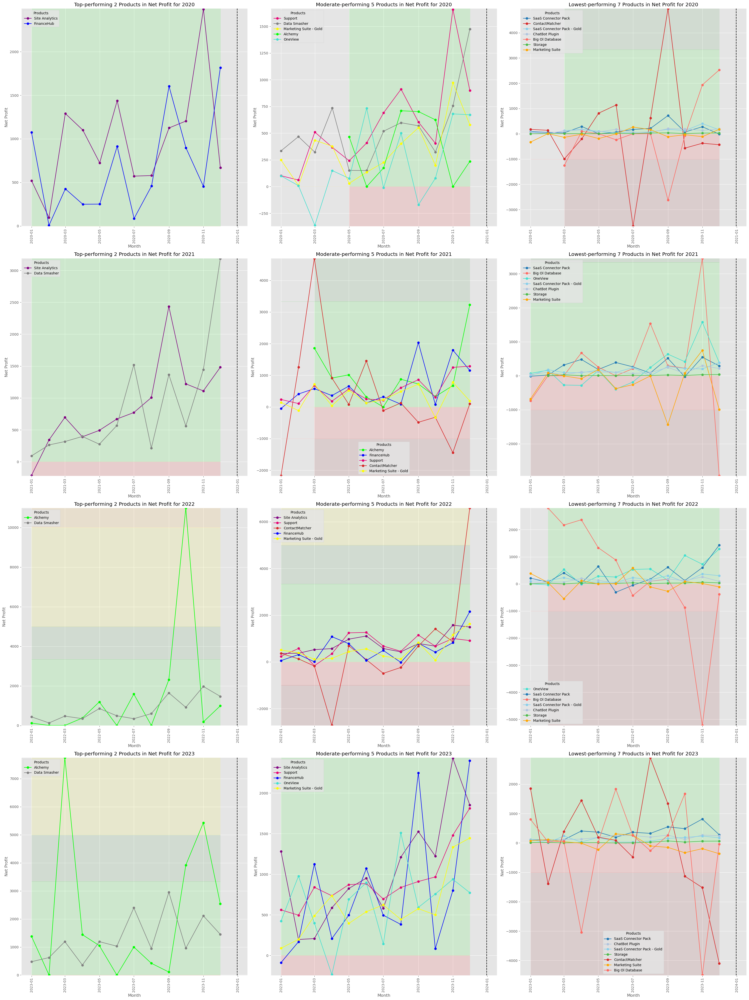

In [51]:
# Product Profit Performance Chart (2020-2023)
# Create a single figure with subplots for each year's top, moderate, and low product groups
fig, axes = plt.subplots(nrows=len([2020, 2021, 2022, 2023]), ncols=3, figsize=(30, 10 * 4))

for i, year in enumerate([2020, 2021, 2022, 2023]):
    yearly_data = all_product_year_data_sorted[all_product_year_data_sorted['Month'].dt.year == year]
    
    top_2_products = globals()[f"top_2_products_{year}"]
    moderate_5_products = globals()[f"moderate_5_products_{year}"]
    lowest_7_products = globals()[f"lowest_7_products_{year}"]
    
    # Plot for the top 2 products
    ax1 = axes[i, 0]
    top_2_year_data = yearly_data[yearly_data['Product'].isin(top_2_products)]
    for product in top_2_products:
        product_data = top_2_year_data[top_2_year_data['Product'] == product]
        color = product_color_map.get(product, '#000000')  # Default to black if not found
        ax1.plot(product_data['Month'], product_data['net_profit'], label=product, color=color, marker='o')
    # Fill the areas with specified transparency
    ax1.fill_between(top_2_year_data['Month'], 0, 3333.333, color='#00FF00', alpha=0.1)  # Neon green
    ax1.fill_between(top_2_year_data['Month'], 3333.333, 5000, color='#228B22', alpha=0.1)  # Dark green
    ax1.fill_between(top_2_year_data['Month'], 5000, 10000, color='yellow', alpha=0.1)
    ax1.fill_between(top_2_year_data['Month'], 10000, top_2_year_data['net_profit'].max() + 10, color='orange', alpha=0.1)
    ax1.fill_between(top_2_year_data['Month'], 0, -1000, color='red', alpha=0.1)
    ax1.fill_between(top_2_year_data['Month'], -1000, top_2_year_data['net_profit'].min() - 10, color='maroon', alpha=0.1)
    ax1.axvline(pd.Timestamp(f'{year}-12-31'), color='black', linestyle='--')
    ax1.set_xlabel('Month')
    ax1.set_ylabel('Net Profit')
    ax1.set_ylim(top_2_year_data['net_profit'].min() - 10, top_2_year_data['net_profit'].max() + 10)
    ax1.tick_params(axis='x', rotation=90)
    ax1.set_title(f'Top-performing 2 Products in Net Profit for {year}')
    ax1.legend(title='Products')
    ax1.grid(True)
    
    # Plot for the moderate 5 products
    ax2 = axes[i, 1]
    moderate_5_year_data = yearly_data[yearly_data['Product'].isin(moderate_5_products)]
    for product in moderate_5_products:
        product_data = moderate_5_year_data[moderate_5_year_data['Product'] == product]
        color = product_color_map.get(product, '#000000')  # Default to black if not found
        ax2.plot(product_data['Month'], product_data['net_profit'], label=product, color=color, marker='o')
    # Fill the areas with specified transparency
    ax2.fill_between(moderate_5_year_data['Month'], 0, 3333.333, color='#00FF00', alpha=0.1)  # Neon green
    ax2.fill_between(moderate_5_year_data['Month'], 3333.333, 5000, color='#228B22', alpha=0.1)  # Dark green
    ax2.fill_between(moderate_5_year_data['Month'], 5000, 10000, color='yellow', alpha=0.1)
    ax2.fill_between(moderate_5_year_data['Month'], 10000, moderate_5_year_data['net_profit'].max() + 10, color='orange', alpha=0.1)
    ax2.fill_between(moderate_5_year_data['Month'], 0, -1000, color='red', alpha=0.1)
    ax2.fill_between(moderate_5_year_data['Month'], -1000, moderate_5_year_data['net_profit'].min() - 10, color='maroon', alpha=0.1)
    ax2.axvline(pd.Timestamp(f'{year}-12-31'), color='black', linestyle='--')
    ax2.set_xlabel('Month')
    ax2.set_ylabel('Net Profit')
    ax2.set_ylim(moderate_5_year_data['net_profit'].min() - 10, moderate_5_year_data['net_profit'].max() + 10)
    ax2.tick_params(axis='x', rotation=90)
    ax2.set_title(f'Moderate-performing 5 Products in Net Profit for {year}')
    ax2.legend(title='Products')
    ax2.grid(True)
    
    # Plot for the lowest 7 products
    ax3 = axes[i, 2]
    lowest_7_year_data = yearly_data[yearly_data['Product'].isin(lowest_7_products)]
    for product in lowest_7_products:
        product_data = lowest_7_year_data[lowest_7_year_data['Product'] == product]
        color = product_color_map.get(product, '#000000')  # Default to black if not found
        ax3.plot(product_data['Month'], product_data['net_profit'], label=product, color=color, marker='o')
    # Fill the areas with specified transparency
    ax3.fill_between(lowest_7_year_data['Month'], 0, 3333.333, color='#00FF00', alpha=0.1)  # Neon green
    ax3.fill_between(lowest_7_year_data['Month'], 3333.333, 5000, color='#228B22', alpha=0.1)  # Dark green
    ax3.fill_between(lowest_7_year_data['Month'], 5000, 10000, color='yellow', alpha=0.1)
    ax3.fill_between(lowest_7_year_data['Month'], 10000, lowest_7_year_data['net_profit'].max() + 10, color='orange', alpha=0.1)
    ax3.fill_between(lowest_7_year_data['Month'], 0, -1000, color='red', alpha=0.1)
    ax3.fill_between(lowest_7_year_data['Month'], -1000, lowest_7_year_data['net_profit'].min() - 10, color='maroon', alpha=0.1)
    ax3.axvline(pd.Timestamp(f'{year}-12-31'), color='black', linestyle='--')
    ax3.set_xlabel('Month')
    ax3.set_ylabel('Net Profit')
    ax3.set_ylim(lowest_7_year_data['net_profit'].min() - 10, lowest_7_year_data['net_profit'].max() + 10)
    ax3.tick_params(axis='x', rotation=90)
    ax3.set_title(f'Lowest-performing 7 Products in Net Profit for {year}')
    ax3.legend(title='Products')
    ax3.grid(True)


plt.tight_layout()
plt.show()


>Analyzing the net profit data reveals various trends in product performance, showing greater variability compared to revenue with noticeable peaks and negative values. The 14 products are first selected into three subgroups: Lowest-performing, Moderate-performing, and Top-performing based on the yearly net profit. In addition to subgrouping, the analysis is enhanced by color coding the profit values in the chart. Green (profits between $0 and $3,333.33) and dark green (profits between $3,333.33 and $5,000) mark lower to moderate positive values, yellow (profits between $5,000 and $10,000) indicates high profits, and orange (profits above $10,000) represents very high profits. For negative values, red (losses between $0 and -$1,000) and maroon (losses below -$1,000) are used. This approach visually emphasizes the significance of each profit value, making it easier to identify and interpret key trends in product performance.

Top-Performing Products in Net Profit
- Data Smasher has been one of the top-performing two products in net profit since 2021, consistently delivering profits in the lower range. From 2020 to 2023, it showed overall profit growth. While 2020 and 2021 experienced steady upward trends, 2022 and 2023 were more stable but did not grow as sharply. This indicates a phase of adjustment and balanced performance in the latter years.
- Site Analytics was the leading product in 2020 and 2021 but was overtaken by Alchemy in 2022. Profits generally remained in the lower range and were particularly volatile in 2020 and 2023, with notable peaks in November likely due to external factors. In contrast, 2021 and 2022 demonstrated steady and stable growth, reflecting consistent performance. The significant volatility observed in 2023 underscores the need for strategic planning to stabilize profits.
- Alchemy is an unpredictable product with inconsistent profitable periods. Most months see zero profit, but when it does profit, it achieves significant peaks, notably above 10000 in October 2022. Across the years, Alchemy showed a steady rise in profits from 2020 to 2023, starting low in 2020, improving in 2021, and experiencing significant increases in 2022 and 2023. These peaks suggest strategic moves or successful product launches.

Moderate-Performing Products in Net Profit
- FinanceHub was top-performing in 2020 with profits in the lower ranges, but was ousted to moderate-performing the following years. Its has a fairly predictable seasonality, with September and December frequently being the peak month for profits. Across the years, it showed incremental but low improvement in overall profitability.
- Support has consistently been a moderate-performing product in terms of net profit across the years. Monthly profits display a regular trend, with lower ranges throughout most of the year and notable peaks towards the end. By 2023, the product had achieved both stability and significant growth, culminating in the highest net profit recorded in December 2023.
- Marketing Suite - Gold also has consistently been a moderate-performing product in terms of net profit across the years. Despite early variability, 2023 showed consistent growth, culminating in the highest net profit in December. This trend indicates strong end-of-year performance and overall maturation of the product.
- OneView faced significant lows in the early years (2020-2021) but has shown strong recoveries in recent years (2022-2023). It has demonstrated consistent growth and improvement, particularly towards the end of each year, indicating successful strategic adjustments.
 
Low-Performing Products in Net Profit
- Despite generating the highest total revenue of all products, ContactMatcher has significant negative profit peaks each year that offset its high profitable periods. Notable losses include July 2020 (~-3700) despite a peak in September (~5000) and April 2022 (~-2700) despite a peak in December (~6600). Its worst performance was in December 2023, with a loss of over 4000 and only a marginal peak in comparison at August (~2900). While ContactMatcher has demonstrated its potential for high profits, particularly in past years, recent trend shows a decline in profitability, highlighting the urgent need for strategic adjustments to stabilize performance and capitalize on its high-profit potential.
- Standard version of the SaaS Connector Pack has consistently been at the top of the low-performing product across the years. Performance varies, reflecting inconsistent profitability. Profit was reaching its highest point in December 2022, at around 1400. In 2023, the performance slowed down and began to stabilize, suggesting the product might be entering a mature market phase. This indicates a need to strategize for sustained growth and future opportunities.
- Like its standard version, Saas Connector Pack - Gold has also been in the low-performing group across the years, with overall positive profits (though lower than the standard version). It showed generally higher profits during 2020 and 2021. However, in recent years, particularly in 2023, while the profitability declined, the performance has become more stable with less variability.
- Big Ol Database experienced the highest losses in profit among all products, with some months showing extraordinarily significant negative profits, surpassing those of ContactMatcher. This issue was evident early on; September 2020 saw a loss of around -2600, and December 2021 reached approximately -2900. Recent years saw worsening conditions, with November 2022 recording the highest drop in profits at around -5200 and November 2023 at approximately -4500. Addressing these significant profit losses should be the first priority before moving on to any stabilizing strategies, as reducing volatility cannot be prioritized if the product is consistently incurring large losses.
- Despite being a low-performing product overall, the ChatBot Plugin has shown consistent positive performance. In 2023, it continued its upward trajectory with the highest profits recorded in June, September, and November, each at around 260. 
- Likewise, the Storage product has shown consistent growth with minimal fluctuations, despite having lower profits compared to other products.
- Standard version of Marketing Suite has the worst profit performance of all products, with negative profits outweighing positive ones across all years. Significant losses include January 2020 (~ -330), September 2021 (~ -1440), and December 2021 (~ -1000). Occasional gains, like July 2020 (~ 270) and November 2021 (~ 750), are overshadowed by frequent substantial losses. By 2023, profits had declined to marginal levels, with notable negative figures in May (~ -230), October (~ -330), and December (~ -370), highlighting the need for immediate financial intervention.

Overall, top-performing products, like Data Smasher, Site Analytics, and Alchemy, have shown consistent profits with occasional fluctuations, demonstrating strong market positions. Moderate performers, including FinanceHub and Support, exhibited predictable seasonal trends and steady growth, especially towards the end of each year. Low-performing products, such as ContactMatcher, the standard version of Marketing Suite, and Big Ol Database, faced significant negative profits and require urgent strategic interventions to stabilize their performance and capitalize on their potential.

In [ ]:
#### -----For checking individual product profit performance across the years----####
# all_product_year_data_sorted['Month'] = pd.to_datetime(all_product_year_data_sorted['Month'], format='%Y-%m')
# productdata = all_product_year_data_sorted[all_product_year_data_sorted['Product'] == 'Storage']
# fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(14, 28))
# for i, year in enumerate([2020, 2021, 2022, 2023]):
#     yearly_data = productdata[productdata['Month'].dt.year == year]
#     ax = axes[i]
#     ax.plot(yearly_data['Month'], yearly_data['net_profit'], marker='o', label='Net Profit')
#     ax.fill_between(yearly_data['Month'], 0, yearly_data['net_profit'], where=(yearly_data['net_profit'] > 0), color='green', alpha=0.3)
#     ax.fill_between(yearly_data['Month'], 0, yearly_data['net_profit'], where=(yearly_data['net_profit'] <= 0), color='red', alpha=0.3)
#     ax.axvline(pd.Timestamp(f'{year}-12-31'), color='black', linestyle='--')
#     ax.set_xlabel('Month')
#     ax.set_ylabel('Net Profit')
#     ax.set_title(f'Storage Net Profit for {year}')
#     ax.legend()
#     ax.grid(True)
#     ax.tick_params(axis='x', rotation=90)
# plt.tight_layout()
# plt.show()


In [ ]:
###---- For detailed data of individual product profit performance----###
# filtered_df = productdata[['Month', 'net_profit', 'Product', 'Year']]
# filtered_df

#### Product Annual Profit

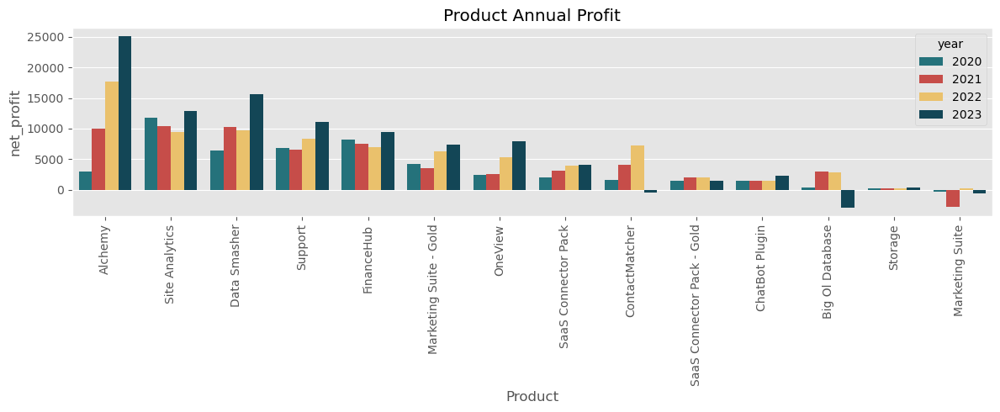

In [52]:
# Product Annual Profit
annual_net_profit = pd.DataFrame(df.groupby(['Product', 'year'])['net_profit'].sum()).reset_index()
total_profit = annual_net_profit.groupby('Product')['net_profit'].sum().reset_index()
sorted_products = total_profit.sort_values(by='net_profit', ascending=False)['Product']

# Reorder products in the annual_net_profit DataFrame
annual_net_profit['Product'] = pd.Categorical(annual_net_profit['Product'], categories=sorted_products, ordered=True)
annual_net_profit = annual_net_profit.sort_values(by='Product')

plt.figure(figsize=(12, 5))
sns.barplot(data=annual_net_profit, x='Product', y='net_profit', hue='year', palette=['#177e89', '#db3a34', '#ffc857', '#084c61'])
plt.xticks(rotation=90)
plt.title('Product Annual Profit')

plt.tight_layout()
plt.show()

- Chart above provides a clear visual representation of the profit contribution from products, arranged from highest to lowest. Interestingly, there are some surprising differences between profit and revenue. For instance, ContactMatcher, which has the highest revenue, ranks among the lowest in terms of profit. Similarly, a low-to-moderate-performing product like Support outperforms top-performing products like FinanceHub in profit contribution.

In [53]:
profit_by_product = df.groupby(['year', 'Product'])['net_profit'].sum().unstack()
profit_by_product

Product,Alchemy,Big Ol Database,ChatBot Plugin,ContactMatcher,Data Smasher,FinanceHub,Marketing Suite,Marketing Suite - Gold,OneView,SaaS Connector Pack,SaaS Connector Pack - Gold,Site Analytics,Storage,Support
year,,,,,,,,,,,,,,
2020,2912.9433,369.1689,1406.8031,1615.6733,6402.7150,8241.0512,-346.1707,4166.2788,2459.4999,1972.8919,1495.4788,11808.0053,178.5583,6861.0770
2021,9930.2988,2977.4856,1485.0582,4086.8695,10197.2752,7551.4447,-2755.2302,3505.4601,2511.8957,3051.8189,1960.1906,10398.8074,171.9376,6545.2916
2022,17742.7926,2907.3180,1408.7534,7197.3390,9664.2885,6955.7658,212.4710,6239.5020,5301.3415,3935.2700,2066.7483,9436.9147,294.0734,8364.3526
2023,25031.7902,-2869.2156,2227.1723,-403.5996,15672.3570,9388.1586,-583.6261,7367.5855,7865.2683,4099.1628,1441.7590,12872.0032,304.9489,11093.7486


##### Product Cost & Profit Margin

Understanding product cost and profit margin is crucial for evaluating the profit of a SaaS product. There are two main types of costs in SaaS: production costs (COGS) and marketing costs (CAC). In this analysis, cost data isn't available in the dataset. Therefore, we calculate `overall_cost` by subtracting `net_profit` from `discounted_sales` (sales after discounts; or revenue). This method reflects the impact of discounts on revenue, but it doesn't allow us to differentiate between production and marketing costs. Detailed cost analysis needs gross profit data, which isn't available.

`Net_Profit_Margin`, the revenue remaining after all costs have been deducted, is used in this analysis to evaluate the growth in profitability of various products over the years and to compare their performance.

C:\Users\arizk\AppData\Local\Temp\ipykernel_884\3894008726.py:14: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=annual_data, x='Product', y='overall_cost', hue='year', palette=['black'], alpha=0.3, edgecolor='black', hatch='///')


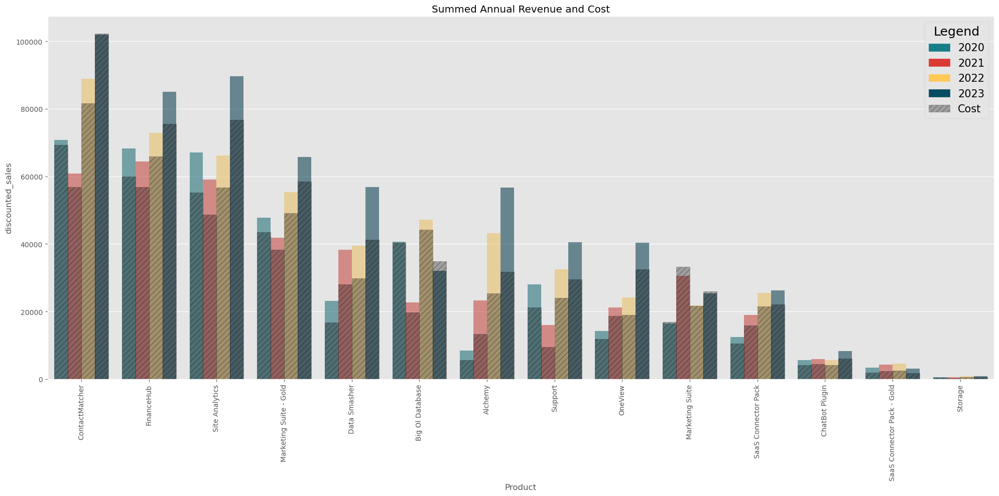

In [54]:
# Summed Annual Revenue and Cost Chart 
annual_data = df.groupby(['Product', 'year']).agg({'discounted_sales': 'sum', 'overall_cost': 'sum'}).reset_index()
total_sales = annual_data.groupby('Product')['discounted_sales'].sum().reset_index()
sorted_products = total_sales.sort_values(by='discounted_sales', ascending=False)['Product']

# Reorder products in the annual_data DataFrame
annual_data['Product'] = pd.Categorical(annual_data['Product'], categories=sorted_products, ordered=True)
annual_data = annual_data.sort_values(by='Product')

plt.figure(figsize=(20, 10))
# Plot revenue bars
sns.barplot(data=annual_data, x='Product', y='discounted_sales', hue='year', palette=['#177e89', '#db3a34', '#ffc857', '#084c61'], alpha=0.6)
# Plot cost bars with transparency and hashed lines
sns.barplot(data=annual_data, x='Product', y='overall_cost', hue='year', palette=['black'], alpha=0.3, edgecolor='black', hatch='///')

# Create custom legend
colors = ['#177e89', '#db3a34', '#ffc857', '#084c61']
labels = ['2020', '2021', '2022', '2023']
custom_handles = [Patch(color=color, label=label) for color, label in zip(colors, labels)]
cost_handle = Patch(facecolor='black', edgecolor='black', hatch='///', label='Cost', alpha=0.3)
custom_handles.append(cost_handle)
plt.legend(handles=custom_handles, title='Legend', fontsize=15, title_fontsize=18)

plt.xticks(rotation=90)
plt.title('Summed Annual Revenue and Cost')
plt.tight_layout()
plt.show()

> The chart above displays the total revenue for each product on an annual basis, including the proportion of costs relative to that revenue. When considering overall costs, profit is only a small part of revenue gains. Higher revenue doesn't always mean higher profit because some products' costs can equal or exceed their revenue gains. As a result, the profit margin, representing the portion of revenue remaining after all costs are deducted, varies significantly between products.

In [55]:
# Cost in Dollars
cost_by_product = df.groupby(['year', 'Product'])['overall_cost'].sum().unstack()
cost_by_product

Product,Alchemy,Big Ol Database,ChatBot Plugin,ContactMatcher,Data Smasher,FinanceHub,Marketing Suite,Marketing Suite - Gold,OneView,SaaS Connector Pack,SaaS Connector Pack - Gold,Site Analytics,Storage,Support
year,,,,,,,,,,,,,,
2020,5528.8875,40291.5026,4143.8125,69216.1511,16662.3346,59997.4214,16822.9798,43523.0688,11799.4368,10445.2349,1853.0792,55225.4255,413.8721,21223.5218
2021,13353.2152,19652.9219,4359.0110,56785.9306,28052.7968,56884.1452,33279.1511,38271.2663,18666.1524,15910.4947,2341.4278,48716.2330,326.5216,9453.4524
2022,25360.6862,44228.8174,4156.8922,81662.4306,29759.4487,65875.6967,21584.0277,49161.5244,18918.4354,21487.0804,2437.3577,56693.1873,598.2958,24057.0774
2023,31667.6858,34914.6507,6110.4589,102280.1941,41167.1006,75577.5809,25865.8026,58410.9525,32519.8313,22094.2576,1706.3702,76763.5384,495.7843,29467.0898


In [56]:
# Cost as Percentage of Revenue based on the total for each year
revenue_by_product = df.groupby(['year', 'Product'])['discounted_sales'].sum().reset_index()
cost_by_product = df.groupby(['year', 'Product'])['overall_cost'].sum().reset_index()
merged_data = pd.merge(revenue_by_product, cost_by_product, on=['year', 'Product'], how='left')
merged_data['Cost_Percentage'] = (merged_data['overall_cost'] / merged_data['discounted_sales']) * 100
cost_percentage_by_product = merged_data.groupby(['year', 'Product'])['Cost_Percentage'].sum().unstack()
cost_percentage_by_product

Product,Alchemy,Big Ol Database,ChatBot Plugin,ContactMatcher,Data Smasher,FinanceHub,Marketing Suite,Marketing Suite - Gold,OneView,SaaS Connector Pack,SaaS Connector Pack - Gold,Site Analytics,Storage,Support
year,,,,,,,,,,,,,,
2020,65.4939,99.0921,74.6550,97.7190,72.2406,87.9232,102.1010,91.2637,82.7512,84.1128,55.3396,82.3849,69.8600,75.5700
2021,57.3505,86.8430,74.5886,93.2862,73.3405,88.2806,109.0265,91.6091,88.1392,83.9059,54.4313,82.4092,65.5062,59.0887
2022,58.8368,93.8321,74.6884,91.9003,75.4861,90.4495,99.0252,88.7376,78.1115,84.5204,54.1141,85.7298,67.0458,74.2012
2023,55.8518,108.9536,73.2877,100.3962,72.4270,88.9507,102.3084,88.7994,80.5243,84.3504,54.2027,85.6396,61.9163,72.6491


> When the cost exceeds 100% of the revenue, it results in a negative profit margin. This means that the expenses are greater than the income, leading to a loss.

In [57]:
# Net Profit Margin by Product
merged_data['Net_Profit_Margin'] = 100 - merged_data['Cost_Percentage']
net_profit_margin_by_product = merged_data.groupby(['year', 'Product'])['Net_Profit_Margin'].sum().unstack()
net_profit_margin_by_product

Product,Alchemy,Big Ol Database,ChatBot Plugin,ContactMatcher,Data Smasher,FinanceHub,Marketing Suite,Marketing Suite - Gold,OneView,SaaS Connector Pack,SaaS Connector Pack - Gold,Site Analytics,Storage,Support
year,,,,,,,,,,,,,,
2020,34.5061,0.9079,25.3450,2.2810,27.7594,12.0768,-2.1010,8.7363,17.2488,15.8872,44.6604,17.6151,30.1400,24.4300
2021,42.6495,13.1570,25.4114,6.7138,26.6595,11.7194,-9.0265,8.3909,11.8608,16.0941,45.5687,17.5908,34.4938,40.9113
2022,41.1632,6.1679,25.3116,8.0997,24.5139,9.5505,0.9748,11.2624,21.8885,15.4796,45.8859,14.2702,32.9542,25.7988
2023,44.1482,-8.9536,26.7123,-0.3962,27.5730,11.0493,-2.3084,11.2006,19.4757,15.6496,45.7973,14.3604,38.0837,27.3509


> Below is a multi-faceted chart which combines bar graphs for revenue and cost for each product, with a line graph for profit margin. It is a way of providing visualization to multiple aspects of financial performance, hopefully for an easier understanding of each product's performance.

C:\Users\arizk\AppData\Local\Temp\ipykernel_884\2198227824.py:21: UserWarning: 
The palette list has fewer values (1) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data=annual_data, x='Product', y='overall_cost', hue='year', palette=['black'], alpha=0.3, edgecolor='black', hatch='///', ax=ax1)
C:\Users\arizk\AppData\Local\Temp\ipykernel_884\2198227824.py:50: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)


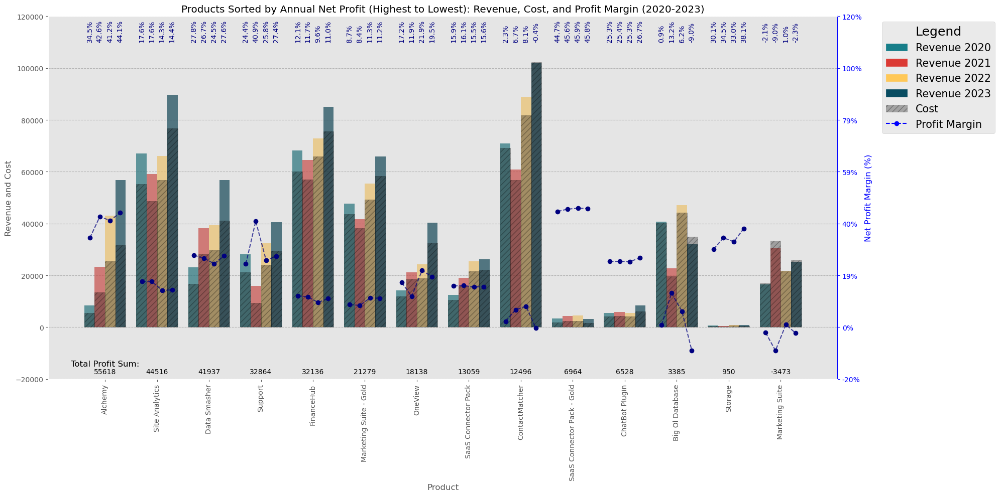

In [58]:
# <Run Summed Annual Revenue and Cost Chart first>
# Calculate total net profit to sort the products
annual_net_profit = pd.DataFrame(df.groupby(['Product', 'year'])['net_profit'].sum()).reset_index()
total_profit = annual_net_profit.groupby('Product')['net_profit'].sum().reset_index()
sorted_products = total_profit.sort_values(by='net_profit', ascending=False)['Product']
# Reorder products based on total net profit
annual_data['Product'] = pd.Categorical(annual_data['Product'], categories=sorted_products, ordered=True)
annual_data = annual_data.sort_values(by='Product')
# Calculate Cost as Percentage of Revenue and Net Profit Margin by Product
revenue_by_product = df.groupby(['year', 'Product'])['discounted_sales'].sum().reset_index()
cost_by_product = df.groupby(['year', 'Product'])['overall_cost'].sum().reset_index()
merged_data = pd.merge(revenue_by_product, cost_by_product, on=['year', 'Product'], how='left')
merged_data['Cost_Percentage'] = (merged_data['overall_cost'] / merged_data['discounted_sales']) * 100
merged_data['Net_Profit_Margin'] = 100 - merged_data['Cost_Percentage']

plt.figure(figsize=(20, 10))
ax1 = plt.gca()
# Plot revenue bars
sns.barplot(data=annual_data, x='Product', y='discounted_sales', hue='year', palette=['#177e89', '#db3a34', '#ffc857', '#084c61'], alpha=0.7, ax=ax1)
# Plot cost bars with transparency and hashed lines
sns.barplot(data=annual_data, x='Product', y='overall_cost', hue='year', palette=['black'], alpha=0.3, edgecolor='black', hatch='///', ax=ax1)

# Create a secondary y-axis
ax2 = ax1.twinx()
ax1.set_ylim(-20000, 120000)  
ax2.set_ylim(-0.2, 1.2) 

# Adjust secondary y-axis ticks to match primary y-axis
ax2.set_yticks(np.linspace(-0.2, 1.2, num=8))  # -20%, 0%, 20%, 40%, 60%, 80%, 100%, 120%
ax2.set_yticklabels([f'{int(tick * 100)}%' for tick in ax2.get_yticks()], color='blue')
ax2.spines['right'].set_color('blue')  
ax2.yaxis.label.set_color('blue')  
ax2.tick_params(axis='y', colors='blue') 

# Ensure grid is in the background
ax1.set_axisbelow(True)
ax1.yaxis.grid(True, linestyle='--', which='both', color='grey', alpha=0.5)
ax2.yaxis.grid(False)  # Disable secondary y-axis grid

# Create custom legend
colors = ['#177e89', '#db3a34', '#ffc857', '#084c61']
labels = ['Revenue 2020', 'Revenue 2021', 'Revenue 2022', 'Revenue 2023']
custom_handles = [Patch(color=color, label=label) for color, label in zip(colors, labels)]
cost_handle = Patch(facecolor='black', edgecolor='black', hatch='///', label='Cost', alpha=0.3)
custom_handles.append(cost_handle)
profit_margin_handle = Line2D([0], [0], color='blue', label='Profit Margin', marker='o', linestyle='--')
custom_handles.append(profit_margin_handle)
ax1.legend(handles=custom_handles, title='Legend', fontsize=15, title_fontsize=18, bbox_to_anchor=(1.05, 1), loc='upper left')

ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax1.set_title('Products Sorted by Annual Net Profit (Highest to Lowest): Revenue, Cost, and Profit Margin (2020-2023)')
ax1.set_xlabel('Product')
ax1.set_ylabel('Revenue and Cost')
ax2.set_ylabel('Net Profit Margin (%)', color='blue')

plt.tight_layout()

# Define unique_years
unique_years = merged_data['year'].unique()

# Add uniform dark blue dot markers, text annotations, and dashed lines for profit margins
horizontal_offsets = [-0.29, -0.1, 0.1, 0.29]  # Horizontal offsets for each year
dark_blue = 'navy'  # Uniform dark blue color

# Group the data by product for dashed lines
for product in sorted_products:
    product_data = merged_data[merged_data['Product'] == product].sort_values(by='year')
    x_positions = []
    y_positions = []
    for index, row in product_data.iterrows():
        product_index = list(sorted_products).index(row['Product'])
        x_pos = product_index + horizontal_offsets[unique_years.tolist().index(row['year']) % len(horizontal_offsets)]  # Apply horizontal offset
        y_pos = row['Net_Profit_Margin'] / 100  # Adjust profit margin to match y-axis scale
        ax2.plot(x_pos, y_pos, 'o', color=dark_blue)
        ax2.text(x_pos, 1.1, f'{row["Net_Profit_Margin"]:.1f}%', color=dark_blue, ha='center', va='bottom', rotation=90)  # Set text at 110%
        x_positions.append(x_pos)
        y_positions.append(y_pos)
    
    # Plot dashed line for the individual product
    ax2.plot(x_positions, y_positions, linestyle='--', color=dark_blue, alpha=0.7)

# Calculate the total annual sum of net profit and add annotations
for product in sorted_products:
    total_net_profit = total_profit[total_profit['Product'] == product]['net_profit'].values[0]
    product_index = list(sorted_products).index(product)
    ax1.text(product_index, -18000, f'{total_net_profit:.0f}', ha='center', color='black')
    
# Add a single "Total Profit Sum" annotation
ax1.text(len(sorted_products) - 14, -15000, 'Total Profit Sum:', ha='center', color='black', fontsize=12)

plt.show()


- Alchemy has proven to be a highly cost-effective product, achieving the highest total profit of 55,618 despite having only the 7th highest total revenue among all products (see 'Summed Annual Revenue'). It consistently maintains a high profit margin, increasing over time to 44.1% in 2023, alongside growing revenue.
- Site Analytics has the 2nd highest total profit (at 44,516), with the 3rd highest revenue. It is is a maturing product, with steady but slowing growth in terms of revenue. As its revenue increases, it is able to keep a stable profit margin (at 14.4% in 2023).
- Data Smasher places 3rd in Total Net Profit (at 41,937), although it is only 5th in Total Revenue. It has managed to keep its profit margin relatively stable (27.6% in 2023), despite its increasing revenue, which signals effective cost management and pricing strategies.
- Support has its highest profit margin when revenue was lowest in 2021, which indicate this product's ability to remain profitable even when not generating high revenue. Perhaps Support is a complementary product, able to drive high margins with lower production and operational costs while delivering significant value. As revenue increases profit margin has since stabilize (at 27.4% in 2023).
- FinanceHub is a maturing product, 2nd in terms of revenue and with steady but slowing growth. Even as its revenue is growing, it is able to keep a stable profit margin, at 11% in 2023. This indicate that the product is consistently delivering value to customers, allowing the company to maintain its pricing strategy. Customers perceive ongoing value, which supports stable pricing and margins.
- Marketing Suite - Gold is in a similar situation to FinanceHub regading its profit margin. Its revenue is growing steadily, but its profit margin is relatively stable (at 11.2% in 2023).
- OneView has had steady increase in revenue throughout the years. However, its profit margin fluctuates (decreasing from 17.25% in 2020 to 11.86% in 2021, increasing and decreasing again the following years). This suggest variations in cost management necessary to boost revenue; the fluctuating decreases, fortunately, is less than the increases.
- SaaS Connector Pack appears to be a maturing product, with revenue growth slowing down. Despite a stable profit margin of 15.6% in 2023, its total revenue ranks 11th among all products and its profit ranks 8th at 13,059. This could be a cause for concern, highlighting the need for innovation to keep the product relevant and growing.
- ContactMatcher achieved the highest total revenue among all products but ranked 9th in total profit at 12,496. Despite increasing profit margins from 2.28% in 2020 to 8.10% in 2022, the profit margin turned negative (-0.40%) in 2023, even with the highest revenue. This suggests significant cost increases, likely due to factors like competition, market changes, or heavy marketing investments.
- SaaS Connector Pack - Gold has very high and stable profit margins (45.8%), but with an extraordinarily low Total Revenue (13th out of 14 products) and Total Profit (at 6528). This product may be targeting a niche market with a limited customer base, which constrains its total revenue and profit potential. Other possible issues might be low sales volume, as revenue in 2023 seems to be decreasing from the previous year.
- ChatBot Plugin, despite having low total revenue, experienced a notable revenue increase in 2023 while maintaining stable profit margins around 25.3%-26.7%. This indicates that as the product scales, it remains cost-effective without compromising profitability.
- Big Ol Database revenue fluctuates, suggesting potential challenges in market demand or sales strategy. Accompanying this is a decreasing profit margin over the years, falling to a low of -9% in 2023. Revenue seems unable to keep up with relatively high costs, leading to a negative profit margin and indicating declining profitability over time.
- Storage has consistently high profit margins (ranging from 30.14% to 38.08% between 2020 and 2023), despite having a very low and fluctuating revenue. It remains profitable due to efficient cost control. 
- Marketing Suite has consistently high costs that outweigh its revenue generation capabilities. This results in mostly negative profit margins and highlights inefficiencies in managing expenses. 

### **3.3. Discounting**
How do discounts effect sales and profit margin? Is there a clear strategy for when and why discounts are offered? Are the discounts sustainable without significantly impacting net profit?

Discount pricing is a strategy where the original price of a product or service is reduced to boost traffic, move inventory, and drive sales. People love getting deals, which creates urgency and encourages purchases. Companies often use discounts during holidays, for bulk purchases, or for cash payments. Amazon has successfully used this approach to build customer loyalty and increase sales by offering additional value, such as free shipping.

However, in the SaaS industry, discounting can be problematic. While retail relies on frequent discounts to drive short-term sales, SaaS companies aim to build long-term customer relationships. Offering discounts in SaaS can lower the perceived value of the product and attract customers who may leave for cheaper options, impacting profitability.

In [59]:
summed_data = df.groupby('year').agg({
    'Sales': 'sum',
    'discounted_sales': 'sum',
    '(net)_profit_before_discount': 'sum',
    'net_profit': 'sum',
    'overall_cost': 'sum'
}).reset_index()
summed_data['Discounted Sales %'] = (summed_data['discounted_sales'] / summed_data['Sales']) * 100
summed_data['Discounted Profit %'] = (summed_data['net_profit'] / summed_data['(net)_profit_before_discount']) * 100
summed_data['revenue_lost_to_discounts'] = summed_data['Sales'] - summed_data['discounted_sales']
summed_data['Net Profit YoY'] = summed_data['net_profit'].pct_change() * 100
summed_data['Net Profit YoY'].fillna(0, inplace=True)
yearly_revenue_growth = summed_data[['year', 'discounted_sales']].copy()
yearly_revenue_growth['Revenue YoY'] = yearly_revenue_growth['discounted_sales'].pct_change() * 100
yearly_revenue_growth['Revenue YoY'].fillna(0, inplace=True)
summed_data['Discounts YoY'] = summed_data['revenue_lost_to_discounts'].pct_change() * 100
summed_data['Discounts YoY'].fillna(0, inplace=True)
summed_data['Discounts %'] = (summed_data['revenue_lost_to_discounts'] / summed_data['Sales']) * 100
summed_data['Profit Margin %'] = (summed_data['net_profit'] / summed_data['Sales']) * 100
summed_data['Revenue %'] = (summed_data['discounted_sales'] / summed_data['Sales']) * 100
summed_data['Sales YoY'] = summed_data['Sales'].pct_change() * 100
summed_data['Sales YoY'].fillna(0, inplace=True)
summed_data = pd.merge(summed_data, yearly_revenue_growth[['year', 'Revenue YoY']], on='year')


In [10]:
#View detailed data
#summed_data

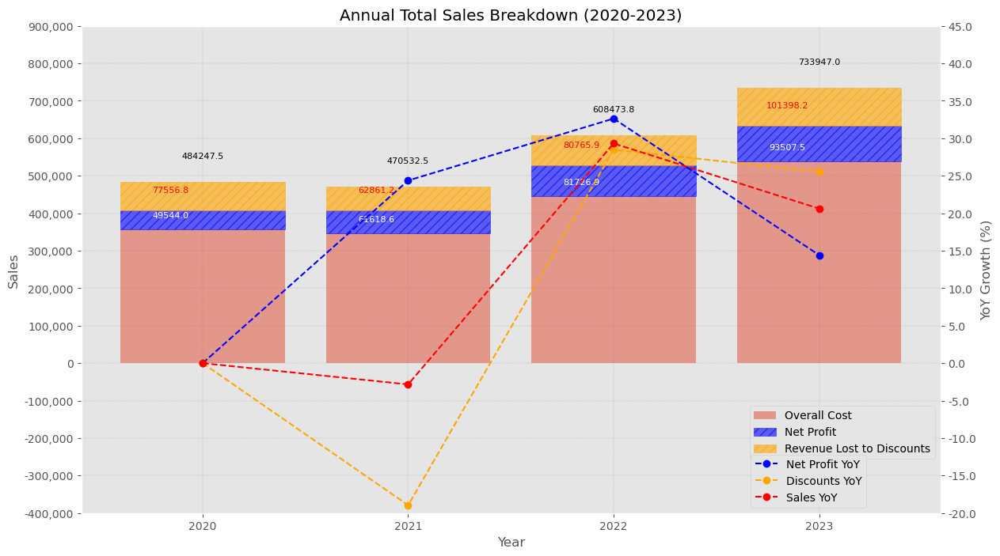

In [60]:
# Annual Total Sales Breakdown (2020-2023) Chart

# Determine the scaling factor
primary_to_secondary_ratio = 100000 / 5  # 100,000 on primary y-axis corresponds to 5 on secondary y-axis
scale_factor = primary_to_secondary_ratio
# Custom ticks for the primary y-axis, including negative values and up to 900,000
primary_ticks = [-400000, -300000, -200000, -100000, 0, 100000, 200000, 300000, 400000, 500000, 600000, 700000, 800000, 900000]
primary_tick_labels = [f'{tick:,}' for tick in primary_ticks]
# Calculate corresponding ticks for the secondary y-axis, including negative values and up to 45
secondary_ticks = [tick / scale_factor for tick in primary_ticks]
secondary_tick_labels = [f'{tick:.1f}' for tick in secondary_ticks]
# Plotting
fig, ax1 = plt.subplots(figsize=(14, 8))  # Adjust figsize to accommodate negative values
overall_cost_bars = ax1.bar(summed_data['year'], summed_data['overall_cost'], alpha=0.5, label='Overall Cost')
net_profit_bars = ax1.bar(summed_data['year'], summed_data['net_profit'], bottom=summed_data['overall_cost'],
                          color='blue', alpha=0.6, edgecolor='blue', hatch='///', label='Net Profit')
revenue_lost_bars = ax1.bar(summed_data['year'], summed_data['revenue_lost_to_discounts'], 
                          bottom=summed_data['overall_cost'] + summed_data['net_profit'],
                          color='orange', alpha=0.6, edgecolor='orange', hatch='///', label='Revenue Lost to Discounts')
ax1.set_xlabel('Year')
ax1.set_ylabel('Sales')
ax1.set_title('Annual Total Sales Breakdown (2020-2023)')
ax1.set_xticks(summed_data['year'])
ax1.set_xticklabels(summed_data['year'])
ax1.set_ylim(min(primary_ticks), max(primary_ticks))
ax1.set_yticks(primary_ticks)
ax1.set_yticklabels(primary_tick_labels)
# Annotate the net profit bars with sales lost to discounts values
for i, bar in enumerate(net_profit_bars):
    total_height = summed_data['overall_cost'][i] + summed_data['net_profit'][i]
    value = summed_data['revenue_lost_to_discounts'][i]
    ax1.annotate(format(value, '.1f'), 
                (bar.get_x() + bar.get_width() / 2., total_height),
                ha='center', va='bottom', 
                xytext=(-29, 15),
                fontsize=8,
                color='red',
                textcoords='offset points')
# Annotate the overall cost bars with net profit values
for i, bar in enumerate(overall_cost_bars):
    value = summed_data['net_profit'][i]
    ax1.annotate(format(value, '.1f'), 
                (bar.get_x() + bar.get_width() / 2., summed_data['overall_cost'][i]),
                ha='center', va='bottom', 
                xytext=(-29, 9),
                color='white',
                fontsize=8, 
                textcoords='offset points')
# Annotate sales lost to discounts bars with sales values
for i, bar in enumerate(revenue_lost_bars):
    total_height = summed_data['overall_cost'][i] + summed_data['net_profit'][i] + summed_data['revenue_lost_to_discounts'][i]
    value = summed_data['Sales'][i]
    ax1.annotate(format(value, '.1f'), 
                (bar.get_x() + bar.get_width() / 2., total_height),
                ha='center', va='bottom', 
                xytext=(0, 20),
                fontsize=8,
                color='black',
                textcoords='offset points')
ax2 = ax1.twinx()
scaled_net_profit_yoy = summed_data['Net Profit YoY'] * scale_factor
ax2.plot(summed_data['year'], scaled_net_profit_yoy, 'blue', linestyle='--', marker='o', label='Net Profit YoY')
scaled_discounts_yoy = summed_data['Discounts YoY'] * scale_factor
ax2.plot(summed_data['year'], scaled_discounts_yoy, 'orange', linestyle='--', marker='o', label='Discounts YoY')
scaled_revenue_yoy = summed_data['Sales YoY'] * scale_factor
ax2.plot(summed_data['year'], scaled_revenue_yoy, 'red', linestyle='--', marker='o', label='Sales YoY')
ax2.set_ylabel('YoY Growth (%)')
ax2.set_ylim(min(secondary_ticks), max(secondary_ticks))
ax2.set_yticks(primary_ticks)
ax2.set_yticklabels(secondary_tick_labels)
ax1.grid(True, which='both', color='grey', linestyle='--', linewidth=0.3, alpha=0.5)
ax2.grid(False) 

ax1.legend(loc='lower right', bbox_to_anchor=(1, 0.1))
ax2.legend(loc='lower right', bbox_to_anchor=(0.92, 0))

plt.show()

This chart shows a strong positive correlation between "Discounts YoY" and "Sales YoY". Increases in discounts generally led to increases in sales volumes. However, the relationship between Net Profit YoY Growth and Discounts YoY indicate potential diminishing returns from aggressive discounting strategies. 
- In 2021, there was a big gap between Net Profit YoY growth (24%), Discounts YoY (-18.95%), and Sales YoY (-2.8%), indicating that reducing discounts helped manage costs effectively. In 2022, the values were closely aligned with Net Profit YoY (32.6%), Discounts YoY (28.5%), and Sales YoY (29%), showing that increased discounts had drove both sales and profit growth. However, in 2023, the gap widened again with Net Profit YoY growth slowing to 14.4%, while Discounts YoY (25.5%) and Sales YoY (20.6%) rose, suggesting that aggressive discounting began to yield diminishing returns on profitability.
- While discounts have driven sales growth, it's essential to evaluate their long-term sustainability and impact on profit margins.

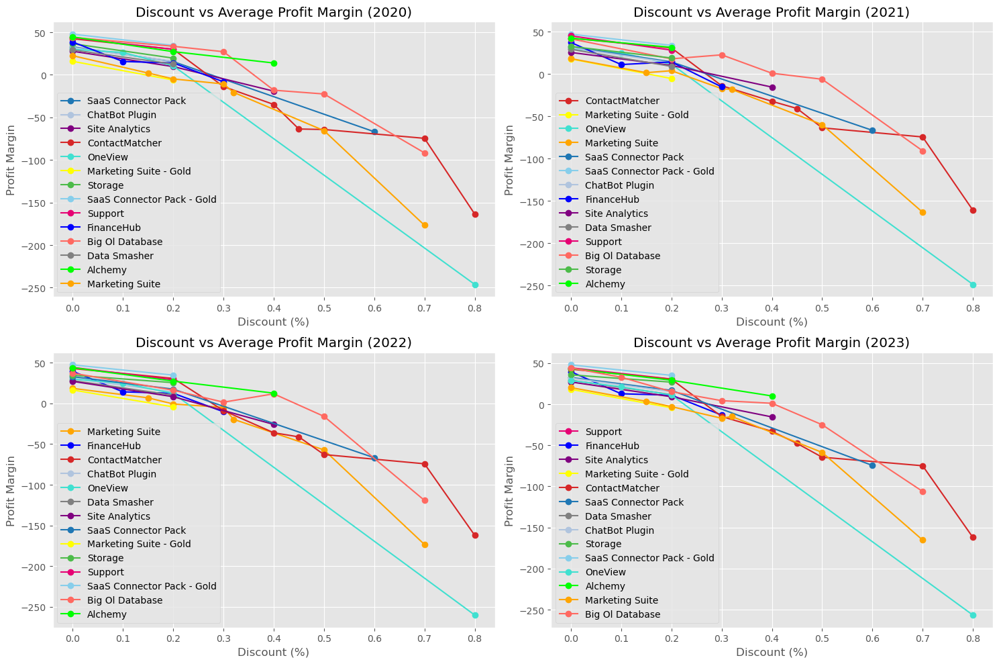

In [61]:
# Profit Margin vs Discounts (2020-2023)
# Define color mapping for products
product_colors = {
    'Marketing Suite': '#FFA500',         
    'Marketing Suite - Gold': '#FFFF00',  
    'SaaS Connector Pack': '#1f77b4',     
    'SaaS Connector Pack - Gold': '#87CEEB', 
    'FinanceHub': '#0000FF',             
    'Data Smasher': '#808080',               
    'ContactMatcher': '#d62728',              
    'Site Analytics': '#800080',               
    'Big Ol Database': '#FF6961',               
    'ChatBot Plugin': '#B0C4DE',             
    'OneView': '#40E0D0',             
    'Storage': '#4cbb49',              
    'Support': '#E60073',              
    'Alchemy': '#00FF00' 
}

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))

# Plot data for each year
years = [2020, 2021, 2022, 2023]
for i, year in enumerate(years):
    ax = axes[i // 2, i % 2]
    year_data = df[df['year'] == year]
    
    for product in year_data['Product'].unique():
        product_data = year_data[year_data['Product'] == product]
        avg_profit_margin = product_data.groupby('Discount')['profit_margin'].mean().reset_index()
        ax.plot(avg_profit_margin['Discount'], avg_profit_margin['profit_margin'], 
                marker='o', linestyle='-', label=product, color=product_colors[product])
    
    ax.set_xlabel('Discount (%)')
    ax.set_ylabel('Profit Margin')
    ax.set_title(f'Discount vs Average Profit Margin ({year})')
    ax.legend()
    ax.grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


- Over the years, the discounting strategy for products has remained unchanged, with each product consistently having the same range of discounts. Profit margins across years, however, showed changes.
- As the discount range increases, the average profit margin of products generally decreases.

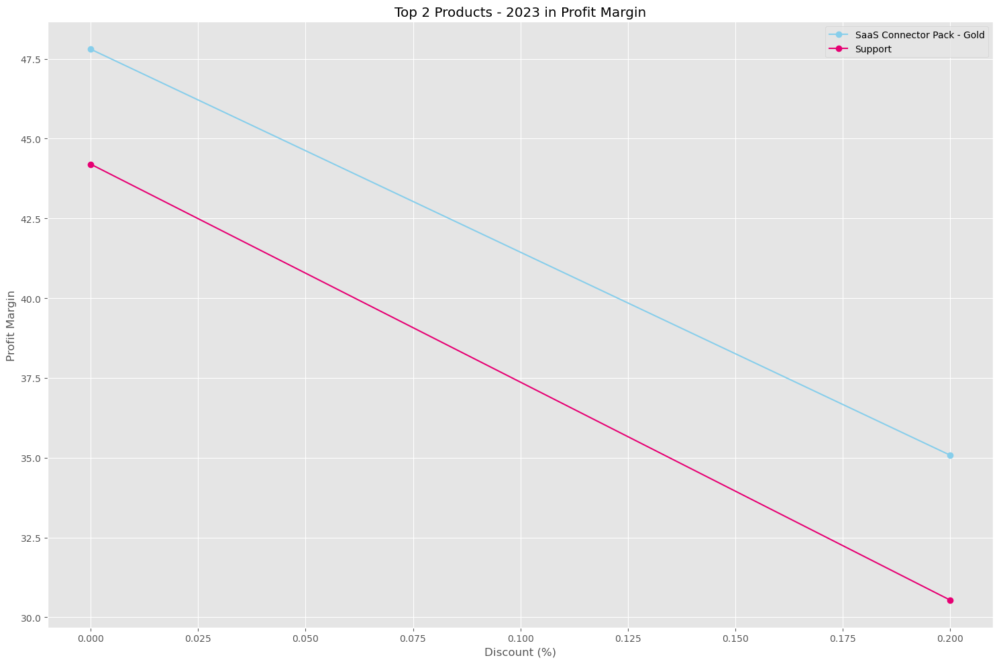

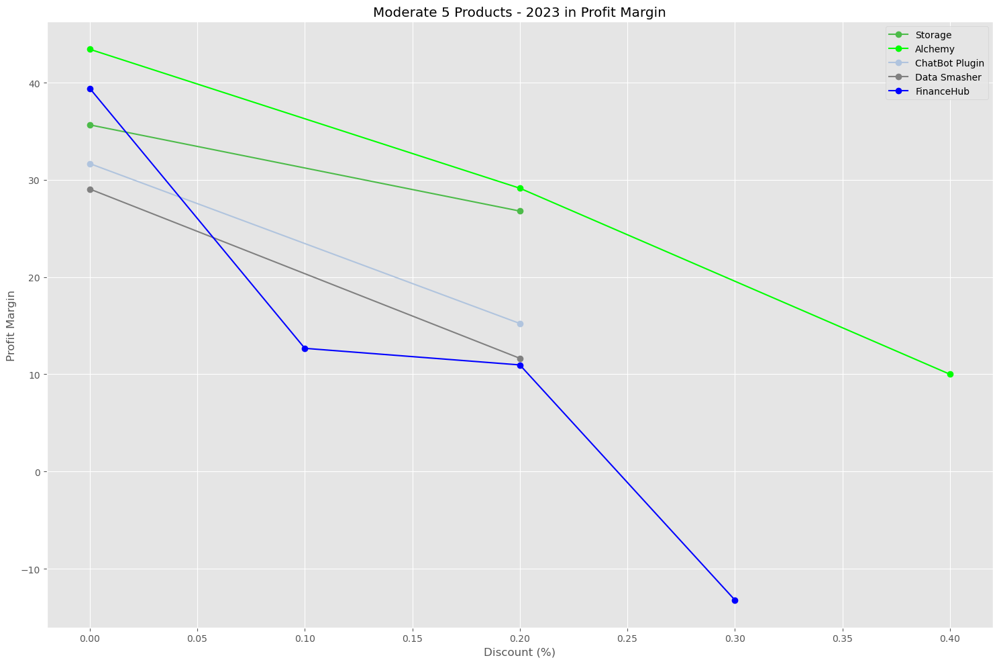

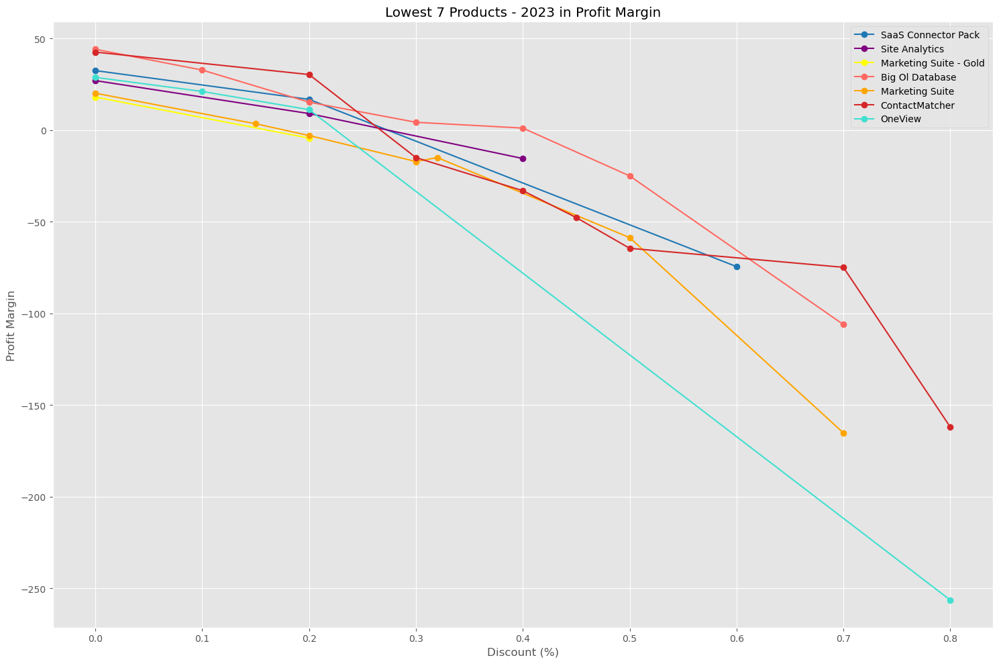

In [ ]:
# Product Profit Margin vs Discounts (2023)
# Define color mapping for products
product_colors = {
    'Marketing Suite': '#FFA500',
    'Marketing Suite - Gold': '#FFFF00',
    'SaaS Connector Pack': '#1f77b4',
    'SaaS Connector Pack - Gold': '#87CEEB',
    'FinanceHub': '#0000FF',
    'Data Smasher': '#808080',
    'ContactMatcher': '#d62728',
    'Site Analytics': '#800080',
    'Big Ol Database': '#FF6961',
    'ChatBot Plugin': '#B0C4DE',
    'OneView': '#40E0D0',
    'Storage': '#4cbb49',
    'Support': '#E60073',
    'Alchemy': '#00FF00'
}

# Filter data for the year 2023
df_2023 = df[df['year'] == 2023]

# Calculate average profit margin for each product in 2023
avg_profit_margin_2023 = df_2023.groupby('Product')['profit_margin'].mean().sort_values(ascending=False)

# Identify top 2, moderate 5, and lowest 7 products
top_2_products = avg_profit_margin_2023.head(2).index.tolist()
moderate_5_products = avg_profit_margin_2023[2:7].index.tolist()
lowest_7_products = avg_profit_margin_2023.tail(7).index.tolist()

# Function to plot products
def plot_products(products, title):
    plt.figure(figsize=(15, 10))
    for product in products:
        product_data = df_2023[df_2023['Product'] == product]
        avg_profit_margin = product_data.groupby('Discount')['profit_margin'].mean().reset_index()
        plt.plot(avg_profit_margin['Discount'], avg_profit_margin['profit_margin'],
                 marker='o', linestyle='-', color=product_colors[product], label=product)
    
    plt.xlabel('Discount (%)')
    plt.ylabel('Profit Margin')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Plot for top 2 products
plot_products(top_2_products, 'Top 2 Products - 2023 in Profit Margin')

# Plot for moderate 5 products
plot_products(moderate_5_products, 'Moderate 5 Products - 2023 in Profit Margin')

# Plot for lowest 7 products
plot_products(lowest_7_products, 'Lowest 7 Products - 2023 in Profit Margin')


Products with higher profit margins typically maintain more stable discounting strategies and don't heavily rely on varying discounts to drive sales, which helps sustain their profitability. In contrast, lower margin products often use fluctuating and aggressive discounting to attract customers, leading to instability and reduced overall profitability.
- Products with high profit margin, like SaaS Connector Pack - Gold and Support, has only one discount range applied (20% discounts).
- As profit margins decrease to moderate level, products like FinanceHub exhibit a wider range of discounts (10%, 20%, 30%). This leads to negative profitability, with units sold at a 30% discount averaging a loss in profitability.
- For lower margin products, highly varying discount ranges are applied. Generally for these products, discounts above 20% result in negative profit margins. Unfortunately, products like ContactMatcher and OneView have had orders with discounts up to 80%, significantly reducing profitability.

Overall, excessive discounting is detrimental to business. While it may help maintain or boost sales, if it leads to losses, it ultimately isn't worthwhile.

#### Discount Threshold for Products

At a certain point, discounts starts to incur losses for certain products. These can be seen below.

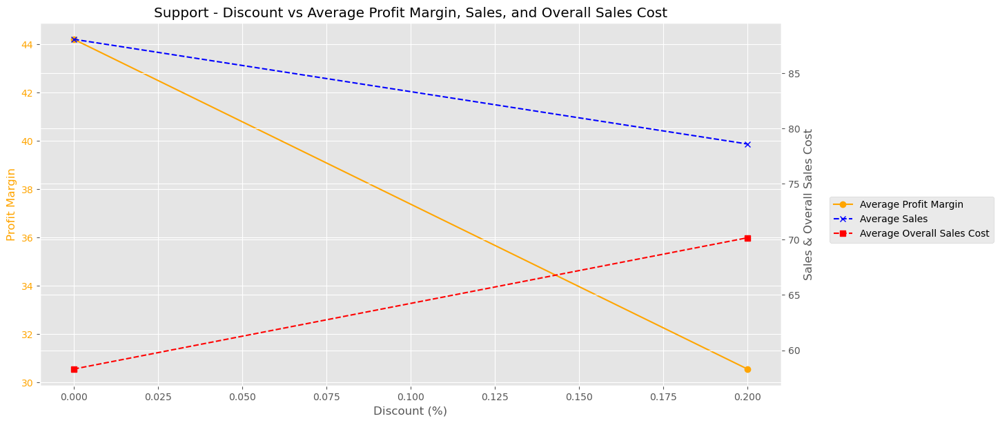

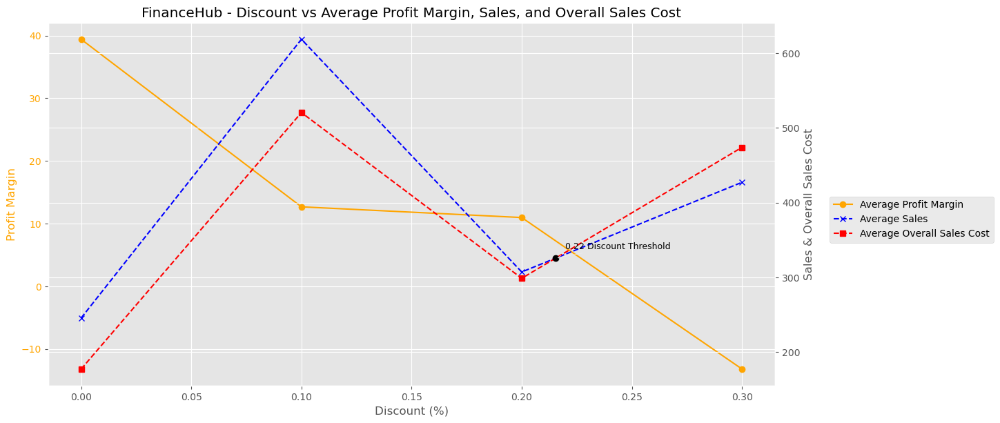

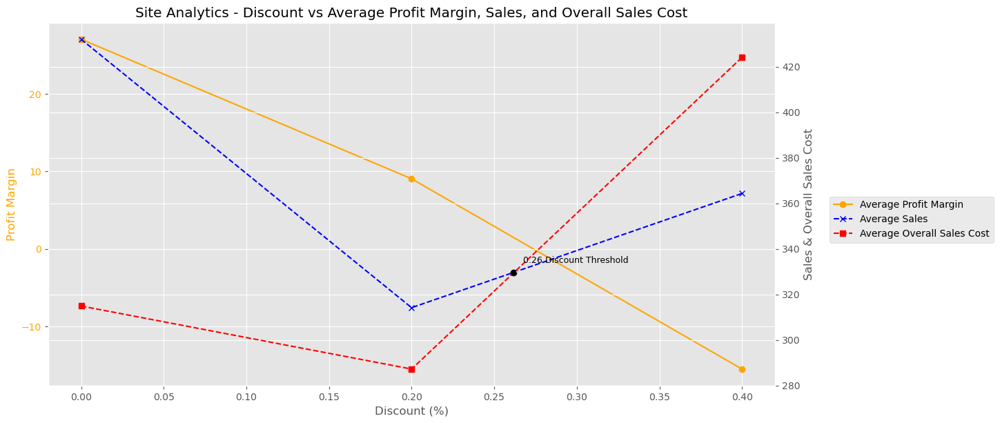

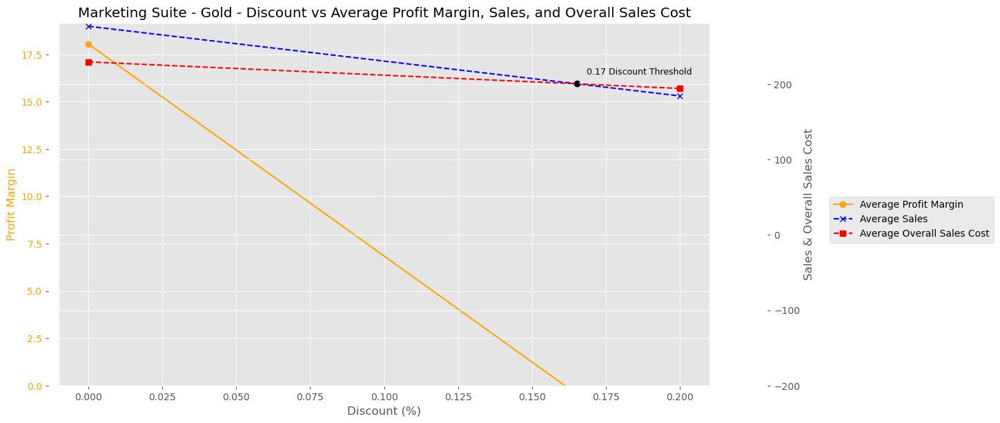

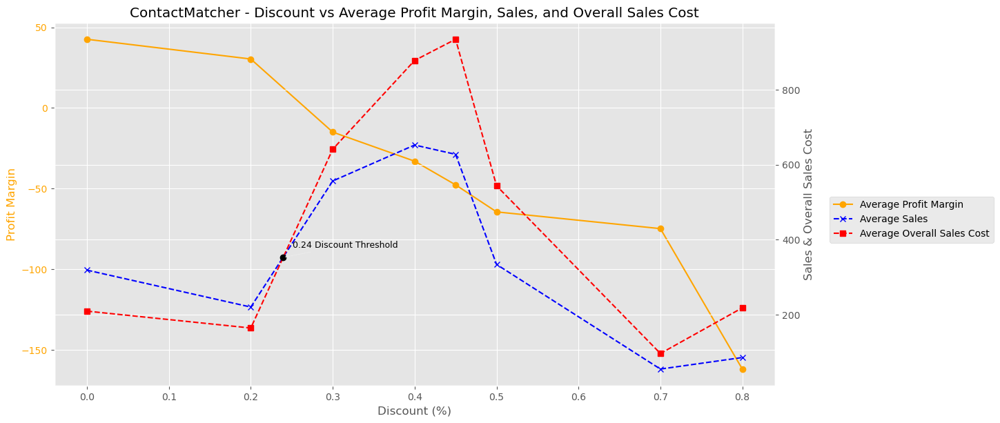

...

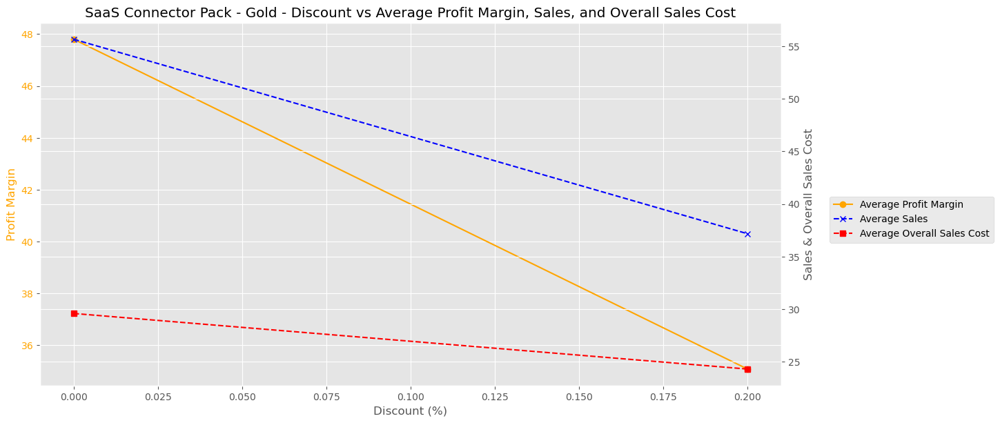

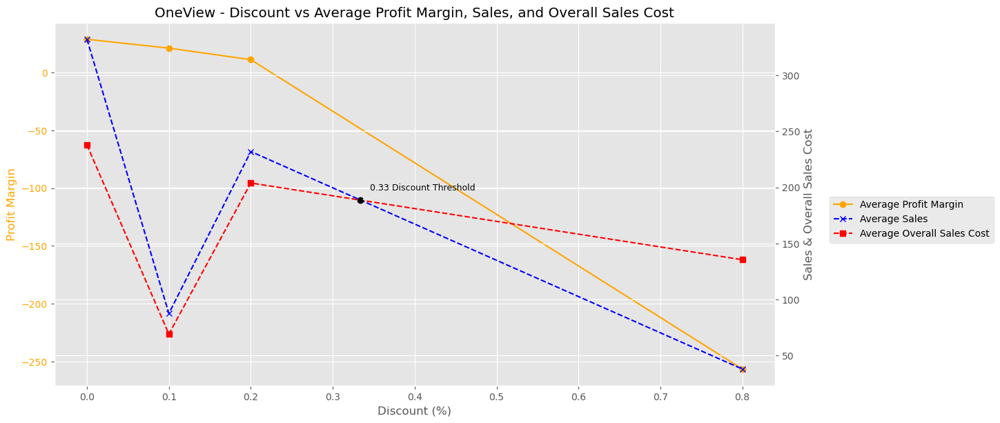

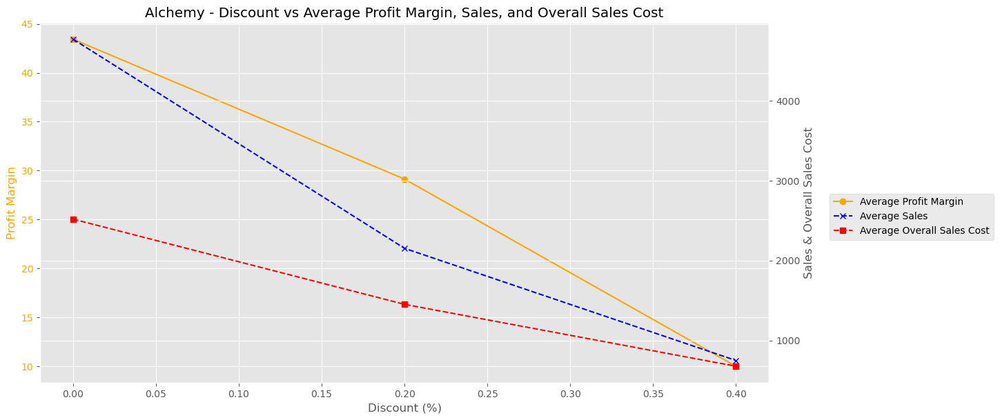

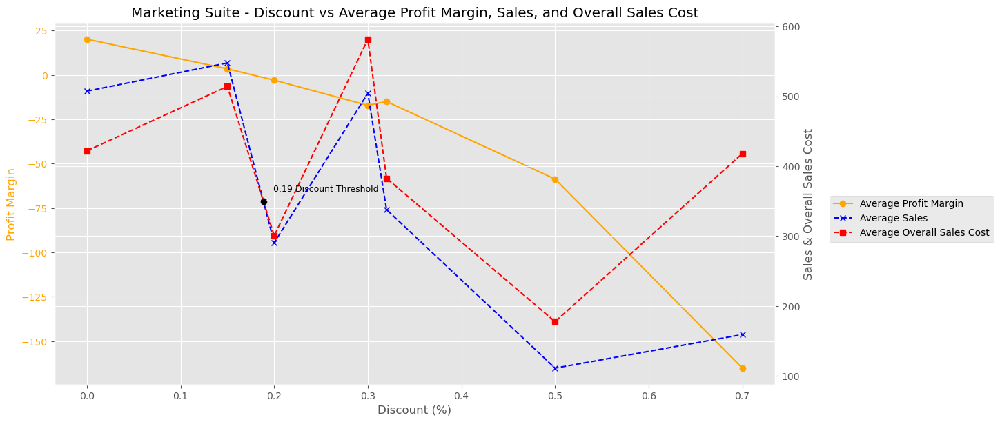

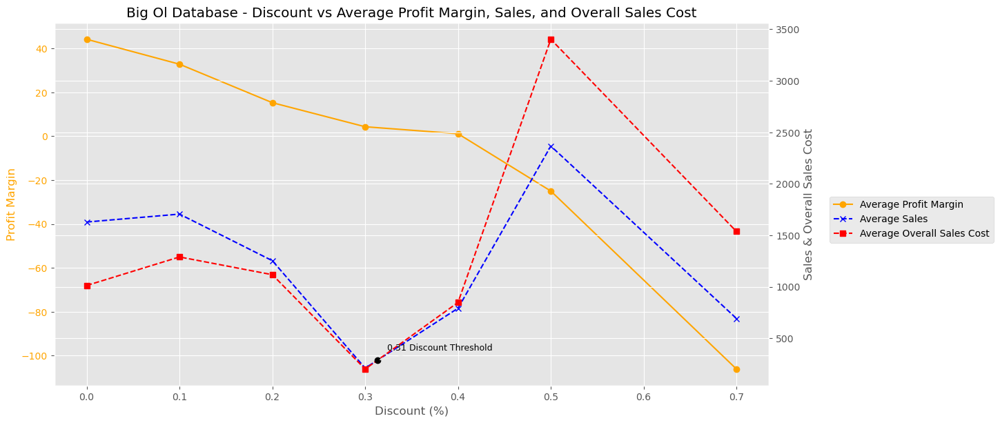

In [62]:
# Discount Threshold Chart
# Calculate overall_sales_cost
df['overall_sales_cost'] = df['Sales'] - df['net_profit']
# Filter data for the year 2023
df_2023 = df[df['year'] == 2023]
# Define the color for the plots
color = 'orange'

# Specify the product for special alignment
specific_product = 'Marketing Suite - Gold'

# Get the unique list of products
products = df_2023['Product'].unique()

# Iterate through each product and generate the chart
for product in products:
    prod_data = df_2023[df_2023['Product'] == product]

    # Group by 'Discount' and calculate the mean 'profit_margin', 'Sales', and 'overall_sales_cost'
    avg_data = prod_data.groupby('Discount').agg({
        'profit_margin': 'mean',
        'Sales': 'mean',
        'overall_sales_cost': 'mean'
    }).reset_index()

    # Interpolate to find the intersection point
    f_sales = interpolate.interp1d(avg_data['Discount'], avg_data['Sales'])
    f_cost = interpolate.interp1d(avg_data['Discount'], avg_data['overall_sales_cost'])

    xnew = np.linspace(avg_data['Discount'].min(), avg_data['Discount'].max(), num=1000, endpoint=True)
    sales_new = f_sales(xnew)
    cost_new = f_cost(xnew)

    # Find the intersection point
    idx = np.argwhere(np.diff(np.sign(sales_new - cost_new))).flatten()
    if idx.size > 0:
        intersection_x = xnew[idx][0]
        intersection_y = sales_new[idx][0]
    else:
        intersection_x = None
        intersection_y = None

    # Plotting
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Plotting profit margin on the first y-axis
    ax1.set_xlabel('Discount (%)')
    ax1.set_ylabel('Profit Margin', color=color)
    ax1.plot(avg_data['Discount'], avg_data['profit_margin'], marker='o', linestyle='-', color=color, label='Average Profit Margin')
    ax1.tick_params(axis='y', labelcolor=color)

    # Creating a second y-axis for Sales and overall_sales_cost
    ax2 = ax1.twinx()
    ax2.set_ylabel('Sales & Overall Sales Cost')
    ax2.plot(avg_data['Discount'], avg_data['Sales'], marker='x', linestyle='--', color='blue', label='Average Sales')
    ax2.plot(avg_data['Discount'], avg_data['overall_sales_cost'], marker='s', linestyle='--', color='red', label='Average Overall Sales Cost')
    ax2.tick_params(axis='y')

    # Add the intersection marker and annotation if it exists
    if intersection_x is not None and intersection_y is not None:
        ax2.plot(intersection_x, intersection_y, 'ko')  # 'ko' means black circle
        ax2.annotate(f'{intersection_x:.2f} Discount Threshold', xy=(intersection_x, intersection_y), xytext=(10, 10),
                     textcoords='offset points', arrowprops=dict(facecolor='black', arrowstyle='->'), fontsize=9)

    # Align the -200 grid on the second y-axis with 0 on the first y-axis for the specific product
    if product == specific_product:
        ax1.set_ylim(bottom=0)
        ax2.set_ylim(bottom=-200)
        ax2.spines['right'].set_position(('outward', 60))
        ax1.spines['left'].set_position(('outward', 10))
        ax1.spines['right'].set_color('none')

    # Adding legends outside the plot
    fig.tight_layout()
    fig.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    # Add title
    plt.title(f'{product} - Discount vs Average Profit Margin, Sales, and Overall Sales Cost')

    # Display the plot
    plt.grid(True)
    plt.show()


In 2023, some products' Average Overall Sales Cost never exceeded their Average Sales, indicating good profitability. These products include:

- Support
- Data Smasher
- ChatBot Plugin
- Storage
- SaaS Connector Pack - Gold
- Alchemy

However, eight products had their Average Overall Sales Cost exceed the Average Sales generated, limiting discounting options. Based on the data, the discounting threshold for these products is as follows:

- FinanceHub: 22% Discount
- Site Analytics: 26% Discount
- Marketing Suite - Gold: 17% Discount
- ContactMatcher: 24% Discount
- SaaS Connector Pack: 26% Discount
- OneView: 33% Discount
- Marketing Suite: 19% Discount
- Big Ol Database: 31% Discount

These products had discount rates above the threshold in 2023, negatively impacting profitability. Moving forward, discounts should be kept below the break-even threshold to ensure profitability. A more detailed analysis of the impact of discounts per product can be found in the individual product reports under "Per Product Performance (2023)."


### **3.4. Product Performance**
Are there any products that are particularly successful or underperforming in terms of financial health? What are the financial challenges of each product?

>Each product in the company has its own financial metrics, presenting unique challenges for decision-making. Some products show promising future profit growth, while others face challenges that need attention. Overcoming these obstacles and seizing opportunities will be crucial for future success.
>
>Understanding each product's function or value is essential to address obstacles and grasp opportunities, even though it's challenging with fictional data. The functional value of each product can be inferred from their names and compared to real-world products.
>
>We can assume:
>
>- Alchemy: Similar to CRM (Customer Relationship Management) tools like Salesforce or HubSpot, which help businesses manage interactions with customers and prospects.
>- Big Ol Database: Comparable to Database Management Systems (DBMS) like MongoDB or MySQL, which provide scalable database solutions.
>- ChatBot Plugin: Similar to Chatbot platforms like Dialogflow or Botpress, which enable the creation and integration of chatbots into various applications.
>- ContactMatcher: Comparable to Lead Generation tools like LinkedIn Sales Navigator or ZoomInfo, which help businesses find and connect with potential clients.
>- Data Smasher: Similar to Data Analytics tools like Tableau or Power BI, which provide powerful data visualization and analysis capabilities.
>- FinanceHub: Comparable to Financial Management Software like QuickBooks or Xero, which assist with accounting, invoicing, and financial reporting.
>- Marketing Suite: Similar to Marketing Automation tools like Marketo or HubSpot Marketing Hub, which streamline marketing campaigns and customer engagement.
>- Marketing Suite - Gold: Enhanced versions of marketing suites with additional features and capabilities.
>- OneView: Comparable to Project Management Software like Asana or Trello, which help teams organize and manage projects.
>- SaaS Connector Pack: Similar to Integration Platforms like Zapier or MuleSoft, which connect different SaaS applications to streamline workflows.
>- SaaS Connector Pack - Gold: Enhanced versions of integration packs with additional connectors and features.
>- Site Analytics: Comparable to Web Analytics tools like Google Analytics or Adobe Analytics, which provide insights into website traffic and user behavior.
>- Storage: Similar to cloud storage solutions like Google Drive, Dropbox, Box, OneDrive, and Amazon S3, which provide secure file storage, sharing, and collaboration services.
>- Support: Similar to Customer Support Software like Zendesk or Freshdesk, which help businesses manage customer inquiries and support tickets.

#### Product Performance Summary (2020-2023)

Based on previous assessments of product performance using criteria such as Active Users, Revenue, Revenue Growth, Net Profit, Profit Margin, and Discounting, we can simplify each product's financial metrics in a summary. Additionally, using the knowledge of each product's function, we can identify "product challenges" that guide decision-making to address obstacles and seize opportunities.

| Product                    | Avg. Active Users | Revenue     | Revenue Growth & Trajectory | Net Profit  | Profit Margin & Trajectory | Discounting                         | Product Challenges                                    |
|----------------------------|-------------------|-------------|-----------------------------|-------------|----------------------------|-------------------------------------|-------------------------------------------------------|
| Alchemy                    | Low               | Moderate    | High, Declining             | High        | High, Increasing           | Cost efficient (20%, 40% Discounts) | User-Centric Improvements                             |
| Big Ol Database            | Low               | Moderate    | Low, Declining              | Negative    | Negative, Declining        | Discount threshold (31% Discount)  | Cost Reduction, Product Improvement                   |
| ChatBot Plugin             | Moderate          | Low         | Low, Increasing             | Low         | Moderate, Stable           | Cost efficient (20% Discounts)      | Feature Development, Tiered Packages                    |
| ContactMatcher             | High              | High        | Low, Stable                 | Negative    | Low, Declining to Negative | Discount threshold (24% Discount)  | Strategic Adjustment, Product Improvement, Tiered Packages             |
| Data Smasher               | Moderate          | Moderate    | Moderate, Stable            | High        | High, Stable               | Cost efficient (20% Discounts)      | Maintain Performance and User Experience              |
| FinanceHub                 | Moderate          | High        | Low, Increasing             | Moderate    | Low, Stable                | Discount threshold (22% Discount)  | Maintain Pricing, Product Improvement                 |
| Marketing Suite            | Low               | Low         | Low, Stable                 | Negative    | Negative, Stable           | Discount threshold (19% Discount)  | Relevancy                                             |
| Marketing Suite - Gold     | Moderate          | Moderate    | Low, Increasing             | Moderate    | High, Stable               | Discount threshold (17% Discount)  | Expand Market Reach, Product Improvement, Tiered Package              |
| OneView                    | Moderate          | Moderate    | Moderate, Stabilizing       | Moderate    | Low, Increasing             | Discount threshold (33% Discount)  | Product Improvement, Operational Efficiency           |
| SaaS Connector Pack        | Moderate          | Low         | Moderate, Decreasing        | Low         | Low, Stable                | Discount threshold (26% Discount)  | Partnerships and Integrations, Product Improvement    |
| SaaS Connector Pack - Gold | Low               | Low         | Low, Decreasing             | Low         | High, Stable               | Cost efficient (20% Discounts)      | Conversion to Standard Version                        |
| Site Analytics             | Moderate          | High        | Low, Increasing             | High    | Low, Stable           | Discount threshold (26% Discount)  | Maintain Pricing, Product Improvement |
| Storage                    | Low               | Low         | Low, Declining              | Low         | Moderate, Increasing       | Cost efficient (20% Discounts)      | Maintain cost-efficiency                                        |
| Support                    | High              | Moderate    | Moderate, Increasing        | Moderate    | Moderate, Stable           | Cost efficient (20% Discounts)      | Maintaining Profit and Value Delivery                 |


- Alchemy: High profit margins but low user engagement and declining revenue growth. By focusing on user-centric improvements, you can attract and retain more users, stabilizing revenue and continuing to grow profit margins. Considering the declining revenue growth, status quo discounts (20%, 40%), however cost-efficient, won't attract new users or ensure retention. Long-term engagement is key.
- Big Ol Database: This product faces a dual challenge: declining popularity (evident in revenue growth) and rising costs (shown by negative and declining profit margins), along with low active users. To recover, it must reduce costs and enhance the product features to attract new users and stabilize revenue growth. Reducing discounts below 31% is a critical first step.
- ChatBot Plugin: Despite having a moderate number of users and increasing revenue growth, its overall contribution to profit and revenue remains low. Instead of focusing on discounts, enhancing the product with new features and creating tiered packages can boost its appeal. For example, offering different plans with increasing features and usage limits, while keeping existing users satisfied.
- ContactMatcher: High active users and revenue but low, declining profitability in 2023 due to excessive discounting up to 80%. Reducing discounts below 24% is critical. Introducing new features and creating tiered packages, while adjusting or eliminating discounts, can highlight its unique benefits and drive sustainable growth.
- Data Smasher: One of the more successful products, it has moderate users, stable revenue, and high profit. With this, comes the challenge to maintain performance and continuously enhance user experience. 
- FinanceHub: Revenue growth has slowed, but a stable profit margin shows that customers see ongoing value. To capitalize on this, maintain pricing and enhance features. Discounts below 22% might attract more customers but could harm perceived value. Thus, focus on maintaining pricing and enhancing features.
- Marketing Suite: Based on its financial metrics, this product has the worst performance among all products, with low users, low revenue, and negative profitability. Given the existence of similar products in the company's lineup, namely Marketing Suite - Gold, it may be worth considering whether to discontinue the product altogether.
- Marketing Suite - Gold: It has moderate users, revenue, and net profit, but its revenue growth rate is slower than other products, at around 11%. However, it maintains a very high and stable profit margin of around 45%. Lower revenue growth suggests market saturation or insufficient customer acquisition strategies. To improve, it needs to target new customer segments and continuously innovate with new features that address emerging marketing trends and needs. Instead of discounting, offering tiered packages with feature options tailored for different customer segments can drive adoption and growth.
- OneView: It has moderate active users, stabilizing revenue growth, and low but increasing profit margins. Stabilizing revenue suggests challenges in gaining new users or expanding existing accounts. Despite growing profit margins, they remain low, indicating a need for better cost management. To grow sustainably, focus on unique features, optimizing operations, and differentiating from competitors, rather than relying on discounts.
- SaaS Connector Pack: Although the product has moderate users, its low revenue, decreasing revenue growth, and low net profit margins indicate it's struggling in the market and financially questionable. Forming strategic partnerships and integrating with popular SaaS applications can enhance its value and attract more users. Introducing new features can also make it more attractive and justify higher pricing. Relying on discounts may not be the best strategy.
- SaaS Connector Pack - Gold: Considering that this enhanced version is performing worse than the standard one, the functionality of the products may be financially questionable. Instead of maintaining two versions, it would be more effective to incorporate the enhancements into the standard version, which already has a higher number of users. 
- Site Analytics: Revenue growth has slowed, but a stable profit margin shows that customers see ongoing value. To capitalize on this, maintain pricing and enhance features. Discounts below 26% might attract more customers but could harm perceived value. Thus, focus on maintaining pricing and enhancing features.
- Storage: It has low average users, revenue, revenue growth, and net profit, but a moderate and growing profit margin. Market saturation and competition with established brands like AWS, Google Cloud, and Microsoft Azure likely contribute to the low user base and revenue. With a slightly better profit margin than Marketing Suite (which has negative profit), the company must decide whether to invest significantly in differentiation and marketing or focus on maintaining cost efficiency.
- Support: It has consistent active users and stable revenue and profit trends. Reaching market maturity, it remains highly profitable even with lower revenue. Its main challenge is to maintain and grow its market position by leveraging its loyal user base and strong profitability. While discounts can temporarily boost sales and attract price-sensitive customers, they may not be the best long-term strategy, as they can lower the perceived value and erode profit margins.

#### Per Product Performance (2023)

Certain analyses, like User Retention, are too detailed for this report and must be conducted individually for each product. Below are links to 2023 product reports, providing insights into performance through key metrics such as active users, retention rate, cohort net revenue, net dollar retention (NDR), cumulative lifetime revenue, and customer lifetime value (CLV). Additionally, in-depth exploratory data analysis (EDA) on profitability, discounting, and customer segments is available.

1. [ContactMatcher Product Report](./Products/ContactMatcher.ipynb)
2. [FinanceHub Product Report](./Products/FinanceHub.ipynb)
3. [Site Analytics Product Report](./Products/Site%20Analytics.ipynb)
4. [Marketing Suite - Gold Product Report](./Products/Marketing%20Suite%20-%20Gold.ipynb)
5. [Big Ol Database Product Report](./Products/Big%20Ol%20Database.ipynb)
6. [Data Smasher Product Report](./Products/Data%20Smasher.ipynb)
7. [Alchemy Product Report](./Products/Alchemy.ipynb)
8. [Support Product Report](./Products/Support.ipynb)
9. [Marketing Suite Product Report](./Products/Marketing%20Suite.ipynb)
10. [OneView Product Report](./Products/OneView.ipynb)
11. [SaaS Connector Pack](./Products/SaaS%20Connector%20Pack.ipynb)
12. [ChatBot Plugin Product Report](./Products/ChatBot%20Plugin.ipynb)
13. [SaaS Connector Pack - Gold](./Products/SaaS%20Connector%20Pack%20-%20Gold.ipynb)
14. [Storage Product Report](./Products/Storage.ipynb)

Below is a summary table from each report:


##### Per Product Summary Table
| Product                    | Total Sales | Net Profit | Avg. Users | Avg. Active Users | Churn Rate | Top Cohort Retention | Most Profitable Months | Net Dollar Retention | Discount Impact | Ideal Customer Segment       | Ideal Customer Industry                                                                                                            | Top Performing Region |
|----------------------------|---------------|------------|------------|-------------------|------------|----------------------|------------------------|----------------------|------------------|------------------------------|-------------------------------------------------------------------------------------------------------------------------------------|-----------------------|
| Alchemy                    | $62,899.39    | $25,031.79 | 10         | 2                 | 99%        | 0% (all cohorts)     | Mar, Oct, Nov          | 0% (all months)      | 68% orders discounted, critical for sales, mostly 20% discount | SMB                           | Consumer Products (AMER), Retail (APJ) (SMB)                                                                                        | AMER                  |
| Big Ol Database            | $43,544.68    | -$2,869.22 | 13         | 2.6               | 97.27%     | 0% (all cohorts)     | Oct, Jan, Jun          | 0% (all months)      | 79% orders discounted, impacts profitability                     | Strategic                     | Energy (EMEA, AMER) (Strategic)                                                                                                    | AMER                  |
| ChatBot Plugin             | $8,914.32     | $2,227.17  | 55         | 19                | 77.27%     | Jan, Apr (retention maintained) | Nov, Dec               | <100% (most months), Feb cohort (118.71%) (Jun), Mar cohort (128.31%) (Jun), Aug cohort (454.93%) (Nov), (140.82%) (Dec)        | 39% orders discounted, consistent 20% discount impacts profits   | SMB                           | Finance (EMEA, AMER), Manufacturing (EMEA), Finance (APJ), Energy (AMER), Tech (AMER), Healthcare (AMER) (SMB)                    | AMER, EMEA            |
| ContactMatcher             | $133,879.73   | -$403.60   | 72         | 33                | 63.55%     | 70% (Jan)            | Aug, Sep               | <100% (most months), Jul cohort 700%, ~400% (following months), Jun cohort ~600% (Sep)                                            | 79% orders discounted, impacts profitability                     | SMB                           | Tech, Energy (AMER), Manufacturing, Finance (EMEA) (SMB)                                                                            | AMER                  |
| Data Smasher               | $59,946.23    | $15,672.36 | 54         | 18                | 79%        | 30% (Q4)             | Sep, Nov, Dec          | <100% (most months), Mar cohort high NDR (99.04%, 98.39% in Aug, Sep)                                                           | 36% orders discounted, effective but room for optimization       | Strategic                     | Tech, Energy, Finance (AMER), Consumer Products, Finance (EMEA), Manufacturing (APJ) (Strategic)                                   | AMER                  |
| FinanceHub                 | $99,415.57    | $9,388.16  | 55         | 19                | 78%        | 20-50% (various months) | Sep, Nov, Dec          | <100% (most months), Mar cohort >100% (Jun, Nov, Dec), significant (200%, 300%) (Nov, Dec), Jul cohort (Sep, Nov, Dec), ~300% (Sep) | 60.5% orders discounted, significant reduction in profits due to discounts | SMB, Strategic                   | SMB: Retail (all regions), Healthcare (AMER), Finance (EMEA); Strategic: Finance (EMEA, APJ), Healthcare (AMER), Energy (APJ)       | EMEA                  |
| Marketing Suite            | $30,024.28    | -$583.63   | 26         | 6                 | 91.5%      | 0% (all cohorts)     | Jun, Dec               | 0% (generally), Jan cohort 194.39% (Nov), 0% (Dec)                                                                                | 74% orders discounted, many negative profits post-discount       | SMB                           | Tech (APJ), Transportation, Energy (AMER) (SMB)                                                                                    | AMER       |
| Marketing Suite - Gold     | $69,834.13    | $7,367.59  | 60         | 20                | 80%        | 1-2 users (mid-year ~40%) | Nov, Dec               | <100% (most months <50%), Sep cohort 155.43% (Oct), Sep cohort 104.86% (Dec), Oct cohort 240.81% (Dec)                            | 41% orders discounted, consistent 20% discount impacts profits   | Strategic                     | Finance (AMER), Manufacturing (APJ, EMEA), Tech (AMER) (Strategic)                                                                  | AMER                  |
| OneView                    | $42,926.93    | $7,865.27  | 47         | 12                | 88%        | 0% (most), 30% (May) | Aug, Nov, Dec          | 0% (generally), Apr cohort 444.88% (Dec), Aug cohort 138.86% (Dec), 158.51% (Oct), May cohort 141.83% (Aug), 118.57% (Nov)        | 39% orders discounted, 20% discount effective, 80% discount causes losses | SMB                           | Finance (EMEA), Consumer Products, Retail (AMER), Healthcare, Communications (EMEA) (SMB)                                         | EMEA                  |
| SaaS Connector Pack        | $28,915.09    | $4,099.16  | 62         | 21                | 78%        | 40% (Apr cohort)     | Nov, Sep, Dec          | <100% (generally), Mar cohort 170.79% (Sep), May cohort 100.37% (Sep), Feb cohort 180.54%, Apr cohort 105.71%, Jun cohort 156.21%, Sep cohort 583.54% (Nov), Aug cohort 148.57%, Sep cohort 226.30% (Dec)    | 40% orders discounted, 20% discount positive but less stable, avoid higher discounts | SMB                           | Healthcare (AMER), Energy (EMEA) (SMB)                                                                                           | EMEA                  |
| SaaS Connector Pack - Gold | $3,378.57     | $3,378.57  | 24         | 6                 | 92%        | 0% (all cohorts)     | Nov, Mar, Dec          | 0%                  | 44% orders discounted, consistent 20% discount impacts profits   | SMB                           | Finance (EMEA), Communications, Energy (APJ) (SMB)                                                                                 | EMEA                  |
| Site Analytics             | $105,642.89   | $12,872.00 | 64         | 21                | 79.5%      | 15-19 users (initial months) | Sep, Nov, Dec          | <80% (generally), Feb cohort (132.63% Jun), (106.56% Jul), (122.56% Sep), May cohort 120.96% (Nov), Jun cohort 111.75% (Nov) | 68% orders discounted, reduced profits by around 50%            | SMB                           | Communications (EMEA), Tech (AMER), Consumer Products (APJ) (SMB)                                 | EMEA                  |
| Storage                    | $857.59       | $304.95    | 26         | 5                 | 96%        | Q4 returns           | Sep, Dec, Nov          | 0% (generally), Jun cohort 141% (initial purchase only 26.05)                                                                     | 33% orders discounted, consistent 20% discount impacts profits   | SMB                           | Energy (EMEA), Finance, Retail, Healthcare, Communications (AMER) (SMB)                                                           | EMEA                  |
| Support | $43,767.61    | $11,093.75 | 67         | 30                | 66%        | 20-60% (Q4)          | Sep, Dec, Nov          | <100% (generally), Feb cohort high NDR, 180.75% (Sep), May cohort 106.03% (Dec), Nov cohort 110.12% (Dec), Jul cohort 111.15% (Aug), Aug cohort 110.33% (Oct) | 39% orders discounted, 20% discount impacts profitability | SMB, Strategic, Enterprise | SMB: Finance (AMER, EMEA, APJ), Energy (EMEA), Healthcare (AMER), Tech (EMEA); Strategic: Finance (EMEA, AMER), Manufacturing (AMER, EMEA), Consumer Products (AMER), Retail (AMER), Energy (APJ); Enterprise: Manufacturing (AMER, APJ), Finance (AMER), Communications (EMEA), Tech (EMEA, APJ), Consumer Products (EMEA) | AMER |




# 4. Conclusion

In revenue, the SaaS company experienced a decline in growth from 29.4% in 2022 to 19.87% in 2023. Additionally, in 2023, revenue growth (19.87%) exceeded net profit growth (14.41%). This divergence suggests that rising costs or operational inefficiencies may be affecting the company’s ability to convert revenue into profit as effectively as before.

Aggressive discounting strategies in 2023 led to diminishing returns on profitability. While discounts boosted sales growth (Sales Year-over-Year at 20.6%), they slowed profit growth (Net Profit YoY at 14.4%). With Discounts YoY rising to 25.5%, the gap between sales and profit growth widened, suggesting that further discounting could harm profitability. It's crucial to reassess these practices to balance sales and profit margins.

Further inquiry showed that there are six cost-efficient products whose Average Overall Sales Cost never exceeded their Average Sales, indicating good profitability: Support, Data Smasher, ChatBot Plugin, Storage, SaaS Connector Pack - Gold, and Alchemy. These products maintain stable discounting strategies and don't rely heavily on varying discounts to drive sales, which helps sustain their profitability.

In contrast, eight lower-margin products, including FinanceHub, Site Analytics, Marketing Suite - Gold, ContactMatcher, SaaS Connector Pack, OneView, Marketing Suite, and Big Ol Database, has had their Average Overall Sales Cost exceed their Average Sales in 2023. These products often use fluctuating and aggressive discounting to attract customers, leading to instability and reduced overall profitability. Reassessing discount practices for these products is essential for long-term sustainability.

Addressing challenges of declining revenue growth, rising costs, and the impact of aggressive discounting requires multiple approaches. Each product, being a driver of revenue and profit for the company, has unique financial metrics and decision-making challenges. Overall, strategies should focus on improving cost efficiency, optimizing discount practices, enhancing features, and targeting new customer segments to ensure long-term profitability and growth.

# 5. Recommendation

Based on the key findings, the following prioritized recommendations are presented:

- **Cost Management**:
  Big Ol Database, Marketing Suite, and ContactMatcher all struggle with high costs impacting their profits. Their performance in 2023 shows that losses have exceeded profitable periods. Big Ol Database's profitability is declining, and Marketing Suite is unable to cover its costs. Despite high revenue, ContactMatcher experienced a negative profit margin due to rising costs. Reducing costs, especially for ContactMatcher, given its strong market demand and revenue potential, is essential to boosting overall profitability and ensuring sustainable growth.

- **Leverage Cost-Efficient Products**:
  Focus on promoting and expanding the six cost-efficient products that have demonstrated good profitability and stable discounting strategies: Support, Data Smasher, ChatBot Plugin, Storage, SaaS Connector Pack - Gold, and Alchemy.

  Among these, three products have shown the highest profitability and stable margins, making them key targets for expansion to maximize profitability and ensure sustainable growth:
  - Alchemy: Focus on user-centric improvements to attract and retain users, stabilize revenue, and grow profit margins through long-term engagement.
  - Data Smasher: Maintain performance and continuously enhance user experience.
  - Support: Leverage its loyal user base to maintain and grow its market position.

- **Maintain Performance of "Cash-cow" Products**:
  "Cash-cow" products are those that consistently generate high revenue and profit margins with minimal investment. These products typically enjoy strong market presence and customer loyalty, leading to steady demand and sales. Being in the mature stage of their product life cycle, they require minimal marketing or development expenses to sustain profitability. As a reliable source of income, cash-cow products fund other experimental or growth-oriented ventures within a company.
  - Site Analytics & FinanceHub: Revenue growth has slowed, but a stable profit margin shows that customers see ongoing value. To capitalize on this, maintain pricing and enhance features.

- **Reassess Discount Strategies**:
  Evaluate the long-term sustainability of aggressive discounting practices to ensure they drive sales without significantly harming profit margins. However, especially for eight products that had their Average Overall Sales Cost exceed the Average Sales generated, the effectiveness of further discounting is limited. These products must have their discounting thresholds set below the following optimal percentages based on the data:
  - FinanceHub: 22%
  - Site Analytics: 26%
  - Marketing Suite - Gold: 17%
  - ContactMatcher: 24%
  - SaaS Connector Pack: 26%
  - OneView: 33%
  - Marketing Suite: 19%
  - Big Ol Database: 31%

- **Dataset Limitation**:
  Lack of detailed cost data in the dataset makes it challenging to accurately assess profit and profitability. While net profit provides a comprehensive view, it combines all expenses, which can distort real-world insights and hinder decisions related to cost management, such as customer acquisition cost (CAC) and discount optimization. To address this, it is essential to collect and integrate detailed cost data, including the cost of goods sold (COGS) and customer acquisition costs (CAC). This would enable the calculation of key metrics like the LTV:CAC ratio, which is vital for evaluating the efficiency of customer acquisition efforts in SaaS. Alternatively, gathering both gross profit and net profit data allows for a more precise analysis of profitability by separating production costs from other operational expenses. This dual approach enhances cost management and strategic decision-making.

- **Strategic Pricing and Discount Alternatives for SaaS**:
  Discounting can lower perceived value of products, attract price-sensitive customers, and create expectations for more deals, impacting profitability. Research shows (see Reference) that initial purchase discounts can reduce perceived value by at least 12%, while free trials and promotions have a lesser effect. In real-world SaaS businesses, discounts are typically bundled with package options and are not extensively used to boost sales. Instead of discounting, consider creating entry-level tiers, adding value through extra features or services, and improving marketing segmentation to better target customer groups.

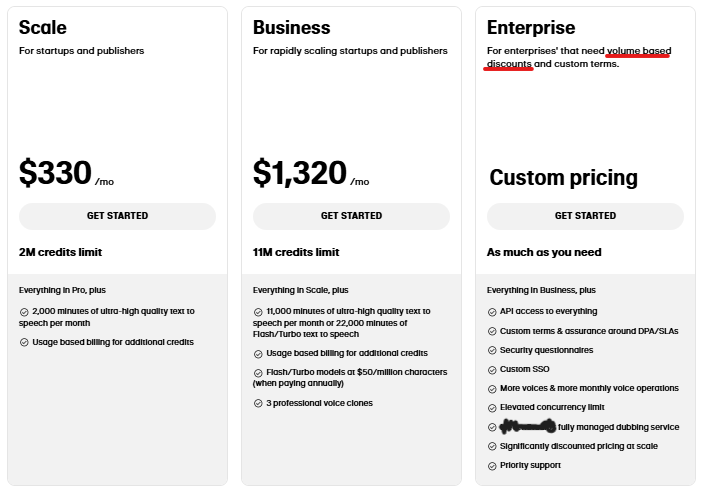

In [63]:
# In a real-world case scenario, this can be seen in a SaaS company specializing in text-to-speech services, as shown below:

from IPython.display import Image
Image(filename='discount example.png')

# References
* Andrews, E. Customer Retention & Cohort Analysis | How VCs Calculate Customer Retention. Available at: https://www.youtube.com/watch?app=desktop&v=OwCATJh4lNg
* Bengualid, K. (2023). SaaS marketing strategies: The ultimate guide to market your SaaS product. Published on December 6, 2023. Available at: https://unbounce.com/general-marketing/saas-marketing-strategies
* Bilolo, D.J. Retail Sales (Exploratory Data Analysis - EDA). Available at: https://www.kaggle.com/code/donjeffbilolo/retail-sales-exploratory-data-analysis-eda/
* Cheng, V. 3 Steps to an Ideal Customer Profile [SaaS]. Available at: https://www.saasceo.com/ideal-customer-profile/
* Hub Analytics. (2024). SaaS Net Profit Margins: Your Comprehensive Guide. Published on April 15, 2024. Available at: https://hub-analytics.com/blog/saas-net-profit-margin/
* Mikhaylov, G. (2020). Sales Report in Pandas. Published on November 17, 2020. Available at: https://medium.com/analytics-vidhya/sales-report-in-pandas-c4ef777cc490
* Mosaic. Customer Cohort Analysis. Available at: https://www.mosaic.tech/financial-metrics/customer-cohorts
* Paddle (2022). Discount Pricing Strategy: Definition, Example & Application. Published on March 8, 2022. Available at: https://www.paddle.com/blog/discount-pricing
* Price Intelligently (2022). Data shows SaaS discounting lowers SaaS LTV by over 30%. Published on July 20, 2022. Available at: https://www.paddle.com/blog/saas-discounting-strategy
* Yasar, K. What is SaaS (software as a service)?. Available at: https://www.techtarget.com/searchcloudcomputing/definition/Software-as-a-Service